### Imports

In [ ]:
import json
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib
from sklearn.cluster import KMeans
import scipy.stats as stats
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import silhouette_samples, silhouette_score
import numpy as np
from datetime import datetime, date
import math
import random
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from matplotlib import colors

pd.set_option('display.max_columns', None)


In [522]:
years = pd.read_csv('https://raw.githubusercontent.com/Aser-Abdelfatah/Portugal-Wildfire-Research/main/Portugal_Dataset_Extraction/data/imputuation.csv', index_col=None)
years = years.drop(columns=['Unnamed: 0'])

In [523]:
years

,x,y,aspect,curvature,d2m,dem,ignition_points,lai,lc_agriculture,lc_forest,lc_grassland,lc_settlement,lc_shrubland,lc_sparse_vegetation,lc_water_bodies,lc_wetland,lst_day,lst_night,ndvi,population,rh,slope,smi,sp,ssrd,t2m,tp,wind_direction,wind_speed,year,cos_day_of_the_year,sin_day_of_the_year,d2m_mean,wind_speed_mean,wind_direction_mean,sp_mean,ssrd_mean,t2m_mean,tp_mean,rh_mean,lst_day_mean,lst_night_mean,cos_month,sin_month,time,repetitions,day_of_the_year,x_int,y_int,day,month,burned_areas,roads_distance
0,-9.480614,38.757993,218.323290,-13973.8610,282.985130,22.818422,0.0,1.560438,0.061867,0.358775,0.000000,0.000000,0.034659,0.000000,0.441838,0.102861,296.929645,288.032020,0.580369,1.502658,0.230728,1.558401,0.13765,96798.682835,8.743087e+06,301.909588,2.902481e-04,335.422999,5.275411,2018.0,0.073095,-0.997325,285.027725,4.736493,270.261873,96643.868063,8.244722e+06,292.715788,0.004570,0.559804,293.054429,284.846219,0.5,-8.660254e-01,2018-10-05,1,278,-948,3875,5,10,1.0,0.000
1,-9.480614,38.768062,238.144700,4664.3843,283.884934,212.681440,0.0,3.700000,0.222479,0.501165,0.000000,0.037123,0.201721,0.000000,0.000000,0.037511,301.220000,291.500000,0.543300,54.910294,0.198069,1.557888,0.13765,96990.468887,8.991473e+06,304.063908,8.134970e-05,310.042245,4.687839,2018.0,0.073095,-0.997325,285.144731,4.527946,268.060353,96855.195703,8.313999e+06,292.659526,0.004674,0.564793,292.744019,285.364868,0.5,-8.660254e-01,2018-10-05,1,278,-948,3876,5,10,1.0,0.172
2,-9.470545,38.727786,285.109130,-2931.3470,283.648578,22.934958,0.0,0.628860,0.094327,0.289674,0.000000,0.299544,0.000000,0.150371,0.166084,0.000000,302.180000,289.720000,0.355900,20.905184,0.211429,1.537272,0.15544,96903.455930,9.025677e+06,302.134732,2.370733e-05,345.993297,5.415241,2018.0,0.073095,-0.997325,285.095545,4.831436,268.375318,96938.469508,8.340271e+06,292.706102,0.004115,0.558188,293.242218,286.102203,0.5,-8.660254e-01,2018-10-05,1,278,-947,3872,5,10,1.0,0.000
3,-9.470545,38.737855,258.798920,-5164.5044,282.971710,18.108190,0.0,1.788257,0.055267,0.467525,0.110535,0.000000,0.000000,0.087259,0.279414,0.000000,296.203893,289.940000,0.640941,4.693551,0.247109,1.542442,0.15544,96842.639444,8.829953e+06,301.057931,1.120156e-04,317.386291,4.934384,2018.0,0.073095,-0.997325,285.086191,4.492348,259.767710,96719.479769,8.310035e+06,292.726538,0.004895,0.559661,293.303680,286.564392,0.5,-8.660254e-01,2018-10-05,1,278,-947,3873,5,10,1.0,0.000
4,-9.470545,38.747924,234.107250,-6697.9670,283.256960,34.618267,0.0,1.717887,0.077921,0.610518,0.012849,0.000000,0.000000,0.000000,0.298713,0.000000,298.409405,287.948147,0.624734,1.748590,0.220172,1.553220,0.13765,96754.398600,8.826432e+06,302.463744,1.780292e-04,316.860164,5.280971,2018.0,0.073095,-0.997325,285.004559,4.727574,267.221810,96623.456931,8.251281e+06,292.695987,0.004377,0.557528,293.894523,284.386758,0.5,-8.660254e-01,2018-10-05,1,278,-947,3874,5,10,1.0,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34564,-6.218267,41.547098,106.000244,-7686.9326,283.891660,656.406300,0.0,0.900000,0.221780,0.177264,0.000000,0.000000,0.600956,0.000000,0.000000,0.000000,314.259980,294.180000,0.394500,0.017831,0.151507,1.541004,0.20800,93184.266000,1.313773e+07,304.147340,7.450581e-09,267.504880,4.061390,2013.0,-0.645348,-0.763889,281.450806,3.787230,169.931061,93441.539062,8.400288e+06,291.294800,0.002467,0.459807,299.066650,282.593445,-0.5,-8.660254e-01,2013-08-21,2,233,-621,4154,21,8,1.0,4.148
34565,-6.218267,41.547098,106.000244,-7686.9326,287.920400,656.406300,0.0,1.000000,0.221780,0.177264,0.000000,0.000000,0.600956,0.000000,0.000000,0.000000,315.763614,292.044794,0.480000,0.017911,0.222242,1.541004,0.32760,93423.055000,1.417653e+07,306.383300,1.367955e-03,356.901200,3.382208,2017.0,-0.976938,0.213521,281.450806,3.787230,169.931061,93441.539062,8.400288e+06,291.2

### Data Exploration

#### Variable Visualization

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\2153200512.py:2: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\2153200512.py:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))
c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\pandas\plotting\_matplotlib\core.py:1259: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


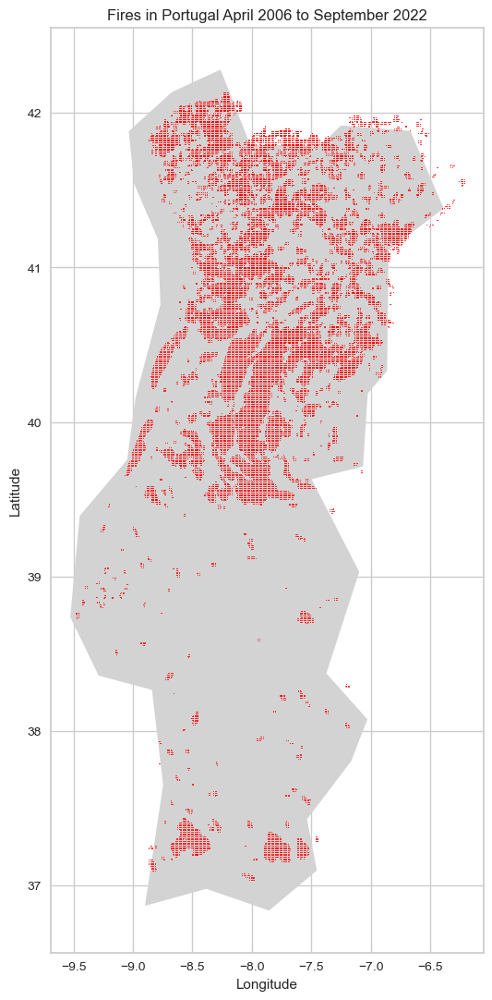

In [774]:
countries = gpd.read_file(
               gpd.datasets.get_path("naturalearth_lowres"))
countries.head()
#countries[countries["name"] == "Portugal"].plot(color="lightgrey")


# initialize an axis
fig, ax = plt.subplots(figsize=(8,6))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey", ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years.plot(x="x", y="y", kind="scatter", 
        c="red", colormap="YlOrRd",  s= 0.15, figsize=(20,13),
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\960648840.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


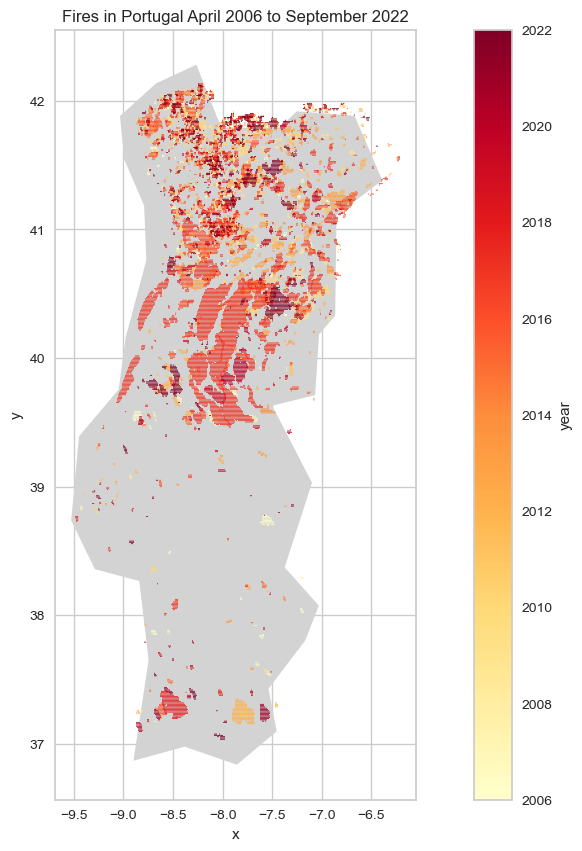

In [775]:
# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years.plot(x="x", y="y", kind="scatter", 
        c="year", colormap="YlOrRd",  s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1561978318.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


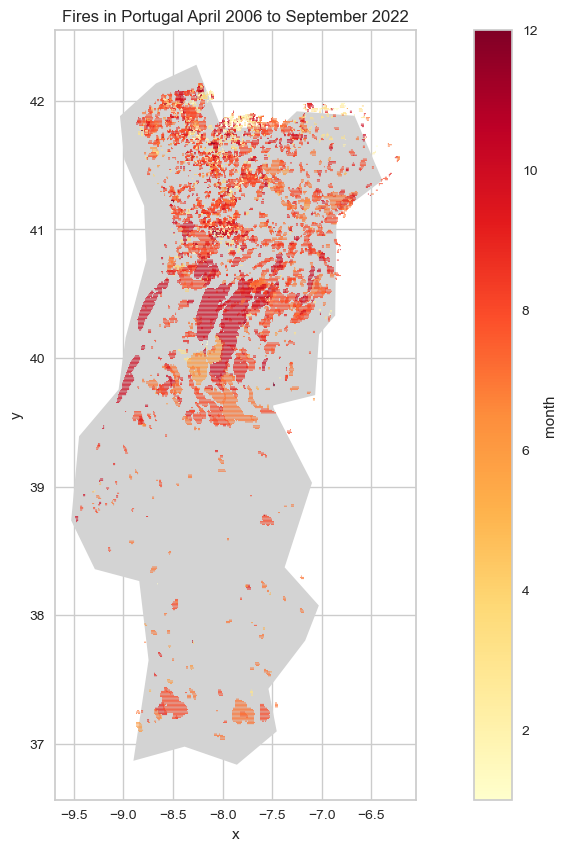

In [776]:
# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years.plot(x="x", y="y", kind="scatter", 
        c="month", colormap="YlOrRd",  s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\2076940634.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


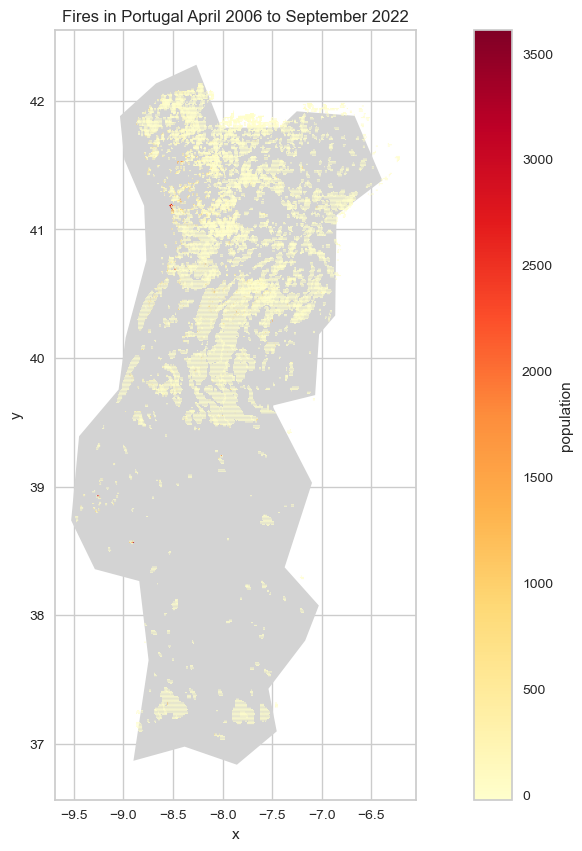

In [777]:
# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years.plot(x="x", y="y", kind="scatter", 
        c="population", colormap="YlOrRd",  s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\598203064.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


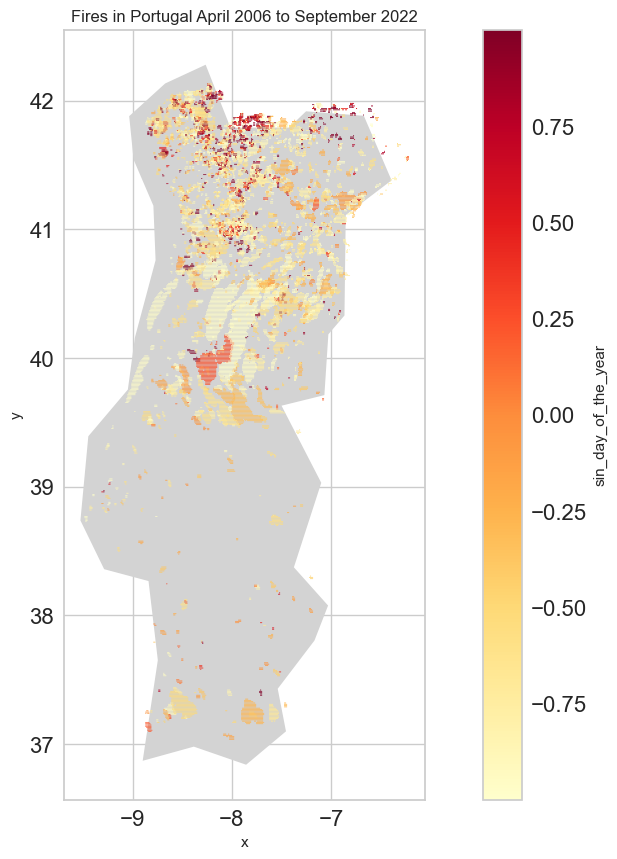

In [780]:
# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years.plot(x="x", y="y", kind="scatter", 
        c="sin_day_of_the_year", colormap="YlOrRd",  s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\3067098004.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


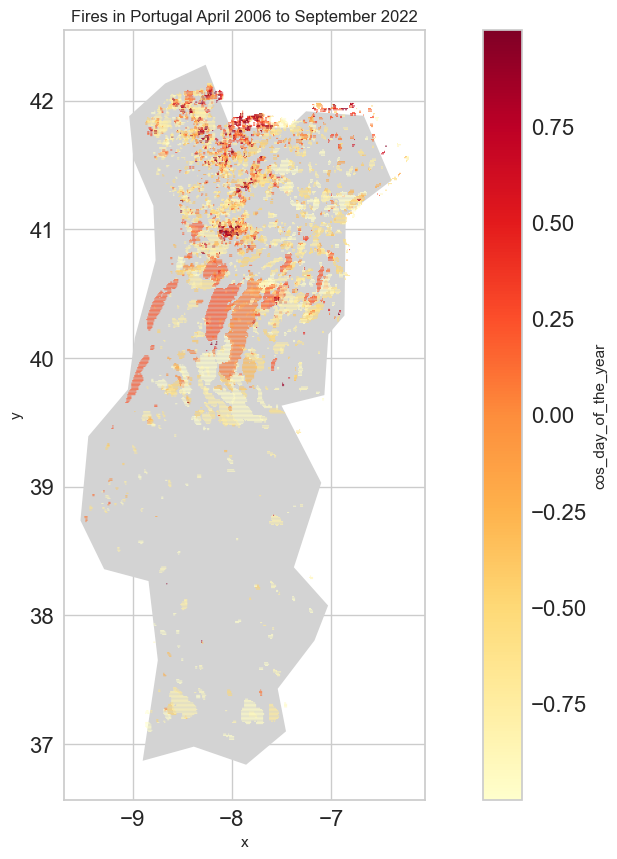

In [779]:
# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years.plot(x="x", y="y", kind="scatter", 
        c="cos_day_of_the_year", colormap="YlOrRd",  s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

#### Box Plot

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\558991859.py:3: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  normalized_df=(years-years.mean())/years.std()
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\558991859.py:3: FutureWarning: The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  normalized_df=(years-years.mean())/years.std()


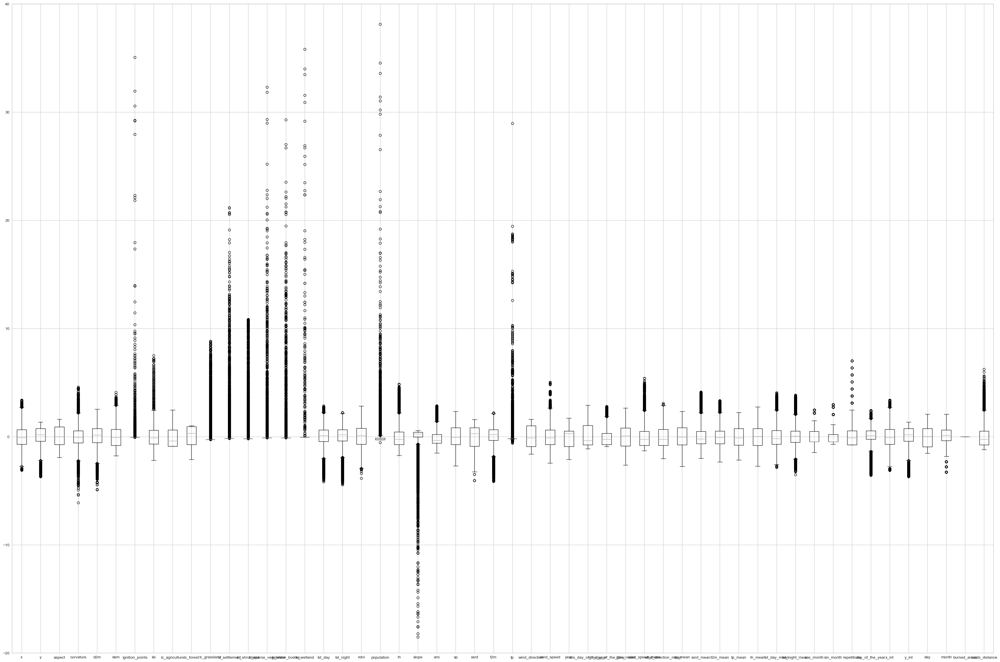

In [778]:
cols = years.columns.to_list()
cols.remove('time')
normalized_df=(years-years.mean())/years.std()
plt.figure(figsize=(45,30))
font = {'size'   : 15}
plt.ylim(-20, 40)
matplotlib.rc('xtick', labelsize=16) 
matplotlib.rc('ytick', labelsize=16) 
matplotlib.rc('font', **font)
boxplot = normalized_df.boxplot(column=cols)
plt.show()


### Silhouette Score

In [ ]:
random.seed(48)
years_knn = years.copy(deep=True)
# drop irrelevant columns
cols = [ 'time', 'day_of_the_year', 'x_int', 'y_int', 'day', 'month', 'burned_areas']
years_knn = years_knn.drop(columns=cols)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.wa

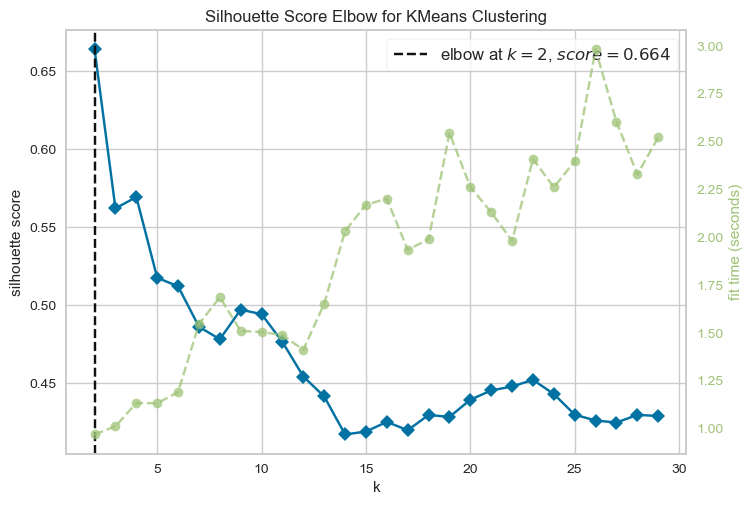

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [526]:
model = KMeans()
elb_visualizer = KElbowVisualizer(model ,metric='silhouette', k=(2,30))
elb_visualizer.fit(years_knn)
elb_visualizer.show()

### 4 Clusters

#### With Lat and Long (All Features)

In [653]:
years_knn = years.copy(deep=True)
# drop irrelevant columns
cols = [ 'time', 'day_of_the_year', 'x_int', 'y_int', 'day', 'month', 'burned_areas']
years_knn = years_knn.drop(columns=cols)

#non-normalized values
years_4 = years_knn.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(years_4)
years_4['cluster'] = kmeans.predict(years_4)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


##### Normalized vs non-normalized

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1364945304.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


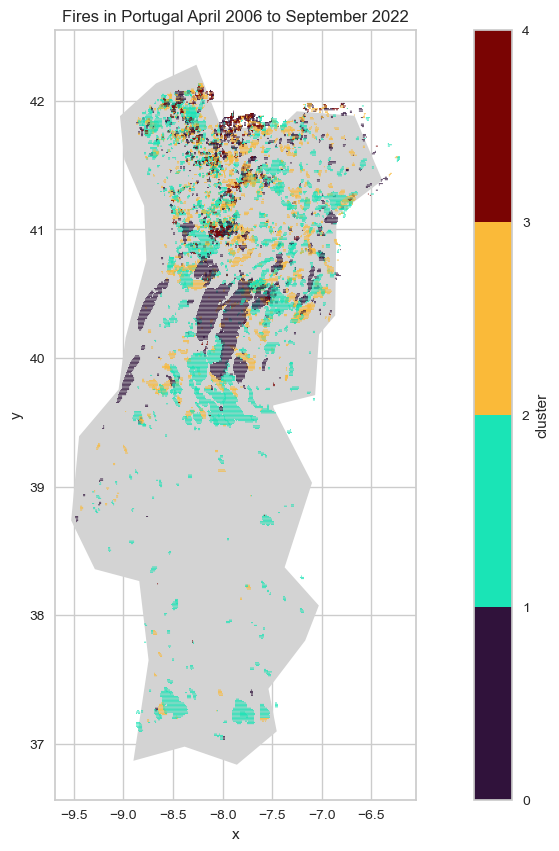

In [654]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years_4['x'] = years_4['x']
years_4['y'] = years_4['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

years_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

In [655]:
# z-score clustering
normalized_df=(years_knn-years_knn.mean())/years_knn.std()
# other clustering methods:
#[0,1]
# normalized_df=(years_knn-years_knn.min())/(years_knn.max()-years_knn.min())
#[-1, 1] normalization:
# normalized_df=(years_knn)/(years_knn.max()-years_knn.min())



normalized_df_4 = normalized_df.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(normalized_df_4)
normalized_df_4['cluster'] = kmeans.predict(normalized_df)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1833439590.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


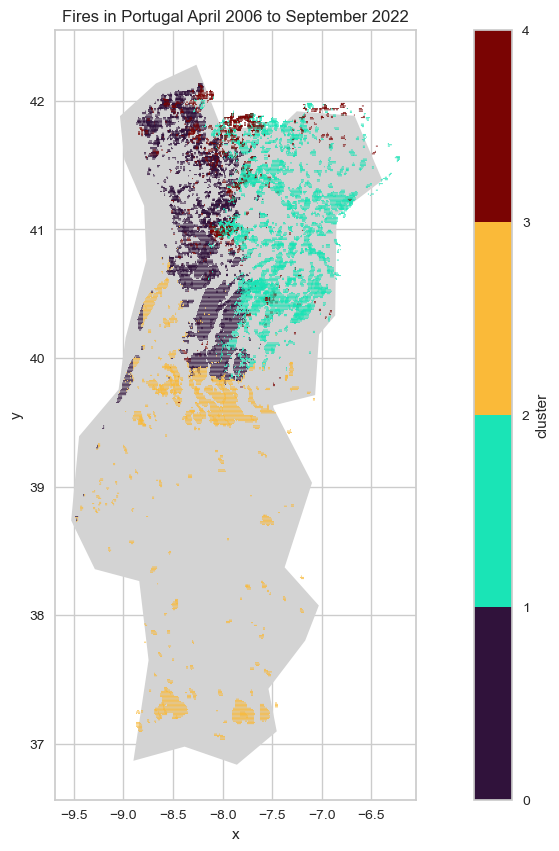

In [656]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

normalized_df_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

Visulaization of clusters show that normalized variables are clustered well with clear separation between the clusters compared to non-normalized.

##### Basic Visualizations

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\916467553.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


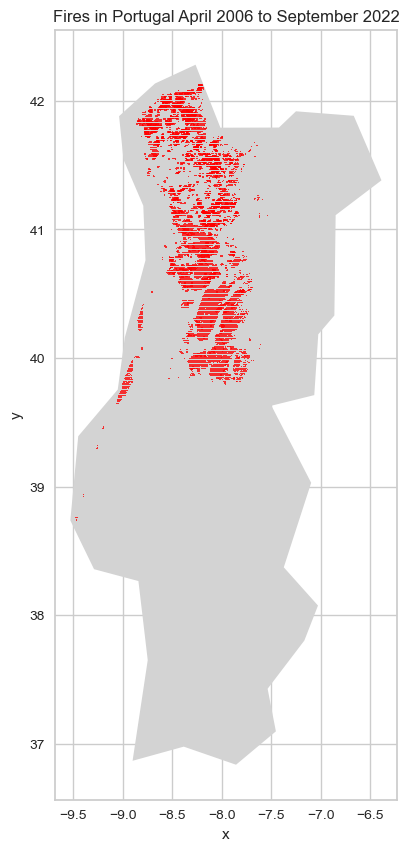

In [657]:
#visualizing first cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_0 = normalized_df_4[normalized_df_4['cluster'] == 0]


normalized_df_4_0.plot(x="x", y="y", kind="scatter", color = 'red',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\116115660.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


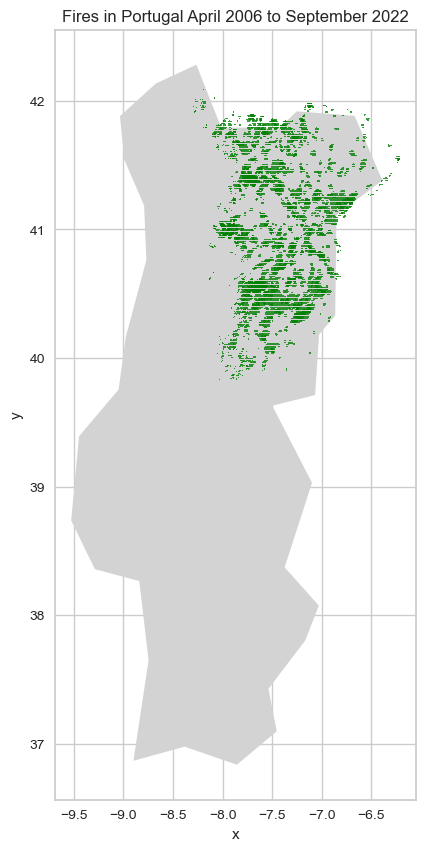

In [658]:
#visualizing second cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_1 = normalized_df_4[normalized_df_4['cluster'] == 1]


normalized_df_4_1.plot(x="x", y="y", kind="scatter", color = 'green',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1057899606.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


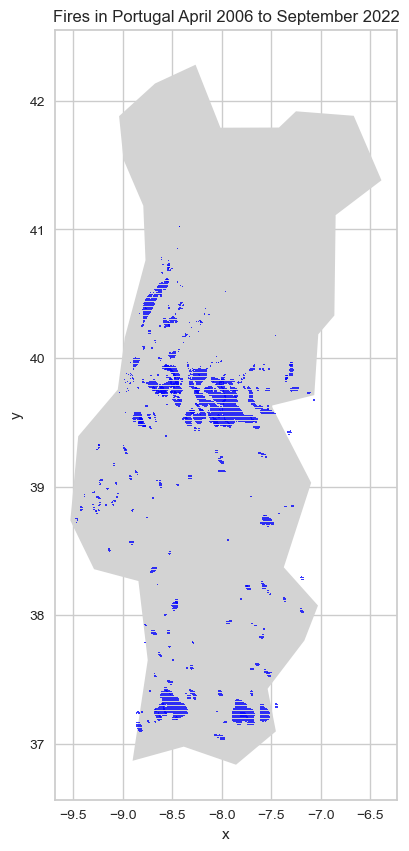

In [659]:
#visualizing third cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_2 = normalized_df_4[normalized_df_4['cluster'] == 2]


normalized_df_4_2.plot(x="x", y="y", kind="scatter", color = 'blue',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\617300168.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


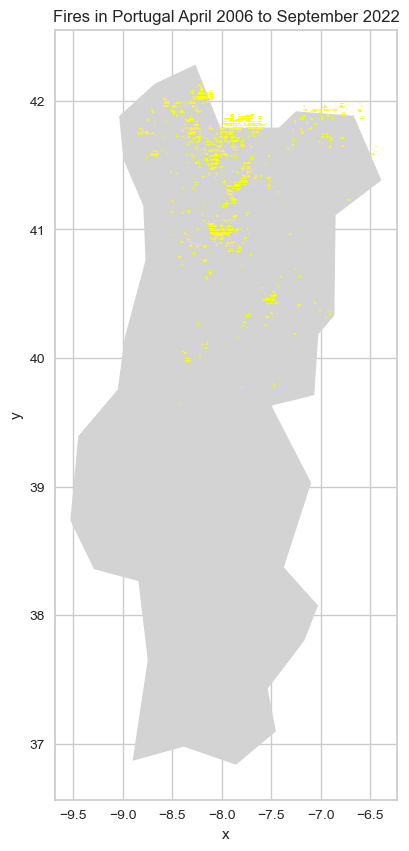

In [660]:
#visualizing fourth cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_3 = normalized_df_4[normalized_df_4['cluster'] == 3]


normalized_df_4_3.plot(x="x", y="y", kind="scatter", color = 'yellow',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

In [661]:
# extract the coordinates of portugal from shape file/ it may be used later
portugal_coordinates = json.loads(countries[countries["name"] == "Portugal"]['geometry'].to_json())['features'][0]['geometry']['coordinates'][0]
portugal_x = [coordinate[0] for coordinate in portugal_coordinates]
portugal_x = np.array(portugal_x)

portugal_y = [coordinate[1] for coordinate in portugal_coordinates]
portugal_y = np.array(portugal_y)

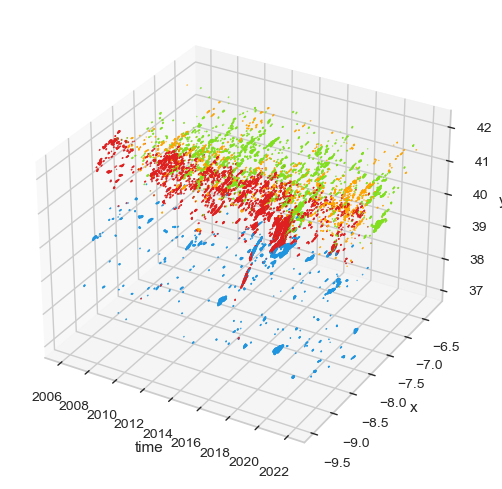

In [662]:
#3d visualization of the distribution of clusters
from mpl_toolkits.mplot3d import Axes3D  

import matplotlib.pyplot as plt
import numpy as np
viz = normalized_df_4.copy(deep = True)
from mpl_toolkits.mplot3d import Axes3D

viz['x'] = years['x']
viz['y'] = years['y']
viz['year'] = years['year']
colors2 = ['#DF2020', '#81DF20', '#2095DF', 'orange']
viz['c'] = viz.cluster.map({0:colors2[0], 1:colors2[1], 2:colors2[2], 3:colors2[3]})
fig = plt.figure(figsize=(26,6))
ax = fig.add_subplot(131, projection='3d')
ax.scatter(viz.year, viz.x, viz.y,  c=viz.c, s=0.5)
ax.set_xlabel('time')
ax.set_ylabel('x')
ax.set_zlabel('y')
plt.show()

##### Plot majority cluster

In [663]:
years_probability = years.copy(deep=True)
years_probability['cluster'] = normalized_df_4['cluster']
years_probability['x_int'] = round(years_probability['x'], 3) * 1000
years_probability['x_int'] = years_probability['x_int'].astype('int')

In [664]:
majority_cluster = years_probability.groupby(['x_int', 'y_int'])['cluster'].aggregate(pd.Series.mode)
x_int = [coordinate[0] for coordinate in majority_cluster.index]
y_int = [coordinate[1] for coordinate in majority_cluster.index]

majority = []
for val in majority_cluster.values:
    # handles edge case when the majority cluster is more than 1, so picks any of them
    if isinstance(val, np.ndarray):
        val = val[0]
    majority.append(val)
    
majority_cluster = pd.DataFrame({'x_int':x_int, 'y_int': y_int, 'cluster':majority})
majority_cluster['x'] = majority_cluster['x_int'].astype('float')
majority_cluster['x'] = majority_cluster['x']/1000
majority_cluster['y'] = majority_cluster['y_int'].astype('float')
majority_cluster['y']  = majority_cluster['y']/100
majority_cluster

,x_int,y_int,cluster,x,y
0,-9481,3875,2,-9.481,38.75
1,-9481,3876,0,-9.481,38.76
2,-9471,3872,2,-9.471,38.72
3,-9471,3873,0,-9.471,38.73
4,-9471,3874,0,-9.471,38.74
...,...,...,...,...,...
22563,-6228,4155,1,-6.228,41.55
22564,-6228,4156,1,-6.228,41.56
22565,-6218,4154,1,-6.218,41.54
22566,-6218,4155,1,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\3901112040.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


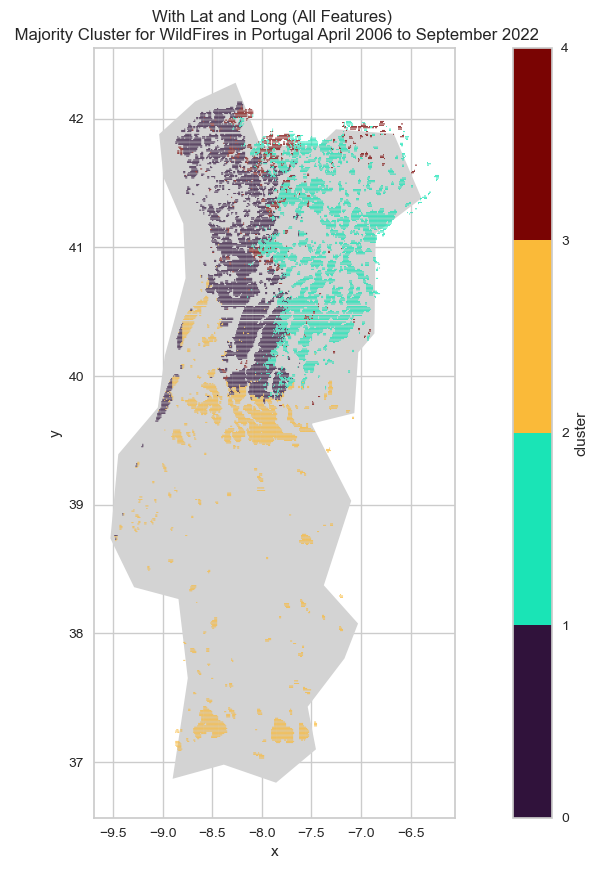

In [665]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

majority_cluster.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"With Lat and Long (All Features) \n Majority Cluster for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Visualize Probability of falling within a cluster

In [666]:
all_clusters = years_probability.groupby(['x_int', 'y_int'])['cluster'].value_counts()

In [667]:
Dict = {}

for idx, coordinate in enumerate(all_clusters.index):
    x_int = coordinate[0]
    y_int = coordinate[1]
    cluster = coordinate[2]
    val = all_clusters.values[idx]
    if tuple([x_int, y_int]) not in Dict:
        clusters = [0, 0, 0, 0]
        clusters[cluster] = val
        Dict[tuple([x_int, y_int])] = clusters
    else:
        Dict[tuple([x_int, y_int])][cluster] = val

x_int = []
y_int = []
cluster_1 = []
cluster_1_prob = []
cluster_2 = []
cluster_2_prob = []
cluster_3 = []
cluster_3_prob = []
cluster_4 = []
cluster_4_prob = []
total = []

for key in Dict:
    x_int.append(key[0])
    y_int.append(key[1])
    cluster_1.append(Dict[key][0])
    cluster_2.append(Dict[key][1])
    cluster_3.append(Dict[key][2])
    cluster_4.append(Dict[key][3])
    total_count = Dict[key][0] + Dict[key][1] + Dict[key][2] +Dict[key][3]
    total.append(total_count)
    cluster_1_prob.append(Dict[key][0]/total_count)
    cluster_2_prob.append(Dict[key][1]/total_count)
    cluster_3_prob.append(Dict[key][2]/total_count)
    cluster_4_prob.append(Dict[key][3]/total_count)



clusters_probablity = pd.DataFrame({'x_int': x_int, 'y_int': y_int, 'cluster1': cluster_1, 'cluster_1_probability':cluster_1_prob, 'cluster2': cluster_2, 'cluster_2_probability':cluster_2_prob, 'cluster3':cluster_3, 'cluster_3_probability':cluster_3_prob, 'cluster4':cluster_4, 'cluster_4_probability':cluster_4_prob, 'total':total})

clusters_probablity['x'] = clusters_probablity['x_int'].astype('float')
clusters_probablity['x'] = clusters_probablity['x']/1000
clusters_probablity['y'] = clusters_probablity['y_int'].astype('float')
clusters_probablity['y']  = clusters_probablity['y']/100

In [668]:
clusters_probablity

,x_int,y_int,cluster1,cluster_1_probability,cluster2,cluster_2_probability,cluster3,cluster_3_probability,cluster4,cluster_4_probability,total,x,y
0,-9481,3875,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.481,38.75
1,-9481,3876,1,1.0,0,0.0,0,0.0,0,0.0,1,-9.481,38.76
2,-9471,3872,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.471,38.72
3,-9471,3873,1,1.0,0,0.0,0,0.0,0,0.0,1,-9.471,38.73
4,-9471,3874,1,1.0,0,0.0,0,0.0,0,0.0,1,-9.471,38.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22563,-6228,4155,0,0.0,2,1.0,0,0.0,0,0.0,2,-6.228,41.55
22564,-6228,4156,0,0.0,1,1.0,0,0.0,0,0.0,1,-6.228,41.56
22565,-6218,4154,0,0.0,2,1.0,0,0.0,0,0.0,2,-6.218,41.54
22566,-6218,4155,0,0.0,2,1.0,0,0.0,0,0.0,2,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\182694575.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


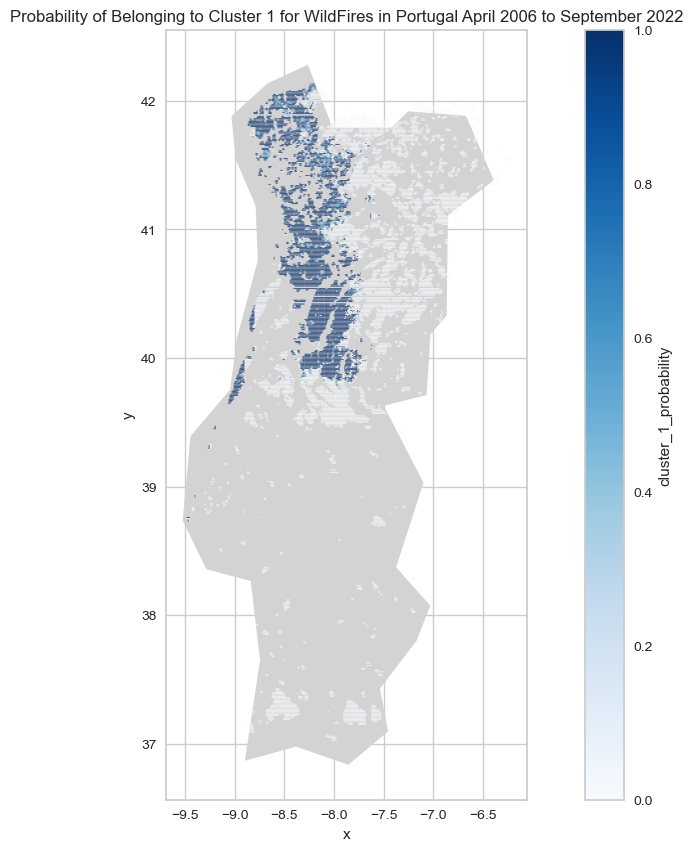

In [669]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_1_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 1 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1781413263.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


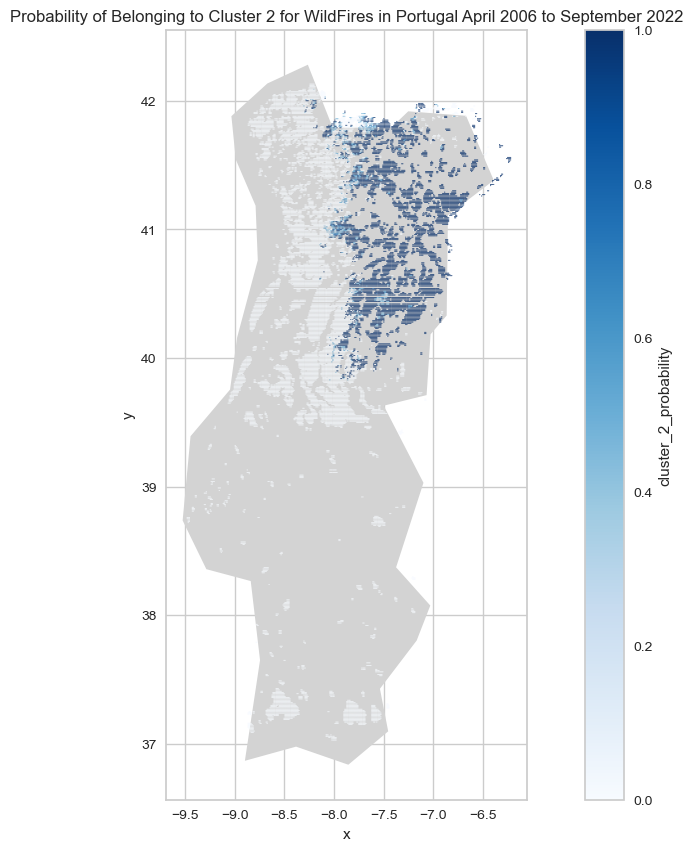

In [670]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_2_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 2 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\336700447.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


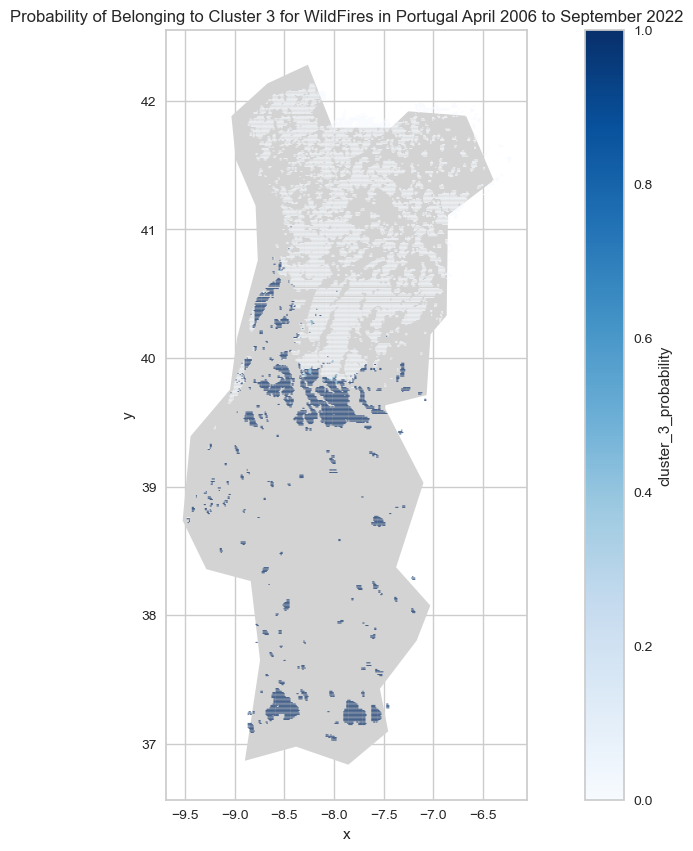

In [671]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_3_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 3 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1814191791.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


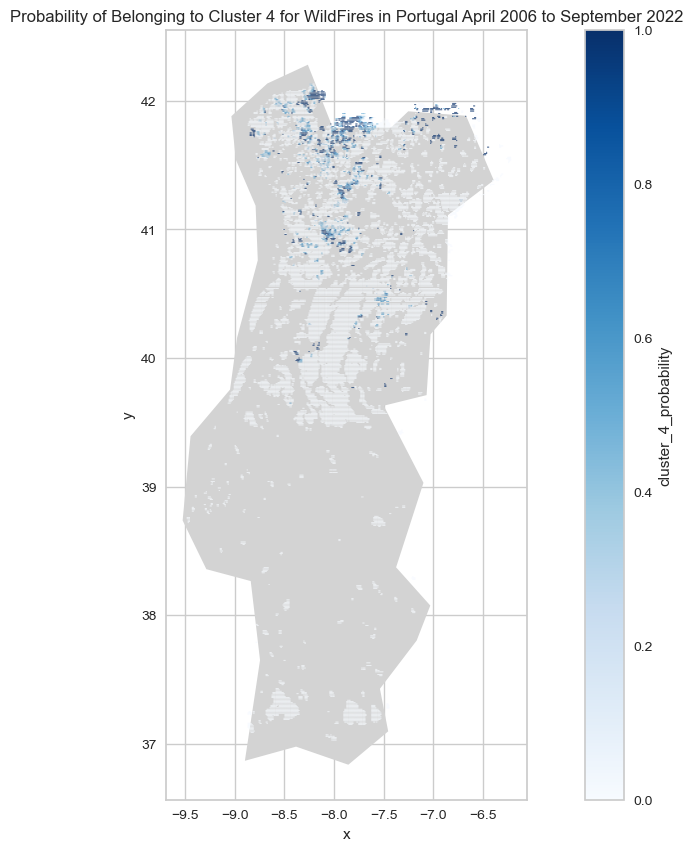

In [672]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_4_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 4 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Box Plot

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .item

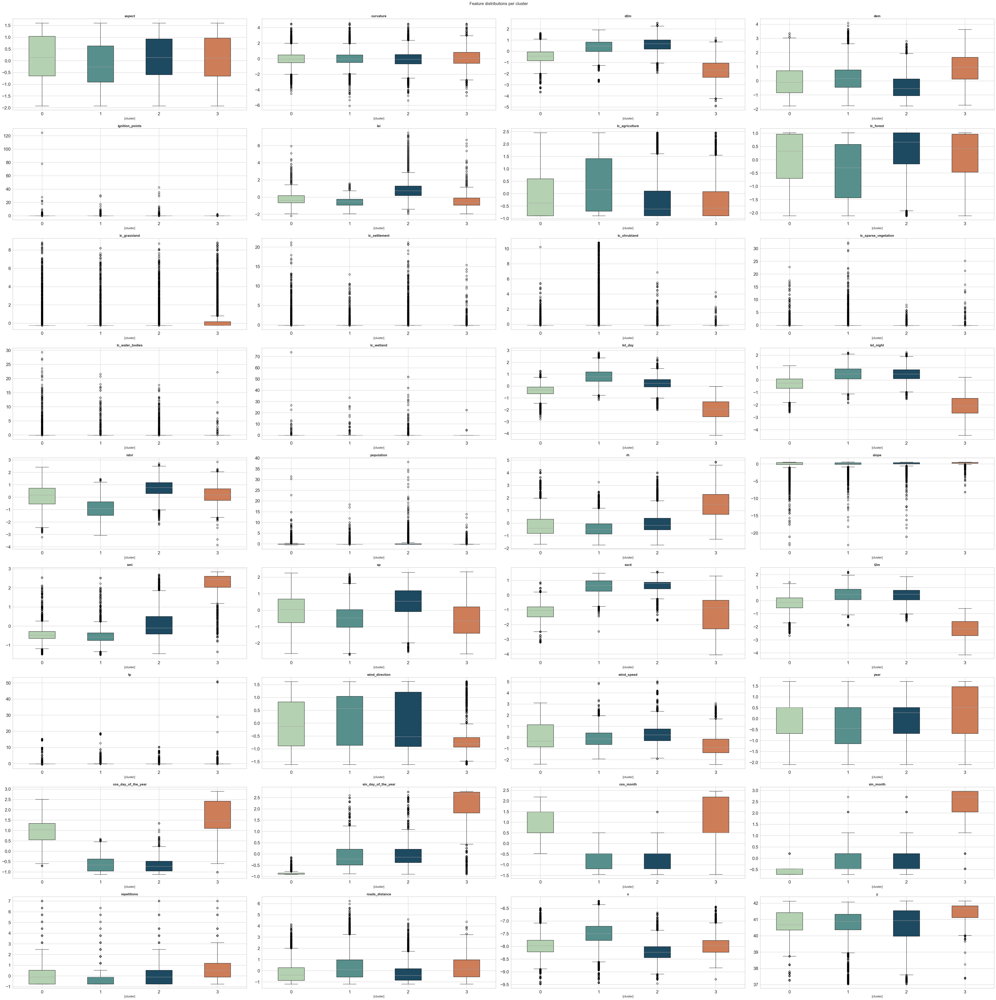

In [782]:
cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59']
normalized_df_4.columns = normalized_df_4.columns.get_level_values(0)
cols = normalized_df_4.columns.to_list()
features = cols
features.remove('cluster')
ncols = 4
nrows = len(features) // ncols + (len(features) % ncols > 0)
fig = plt.figure(figsize=(50,50))

for n, feature in enumerate(features):
    ax = plt.subplot(nrows, ncols, n + 1)
    box = normalized_df_4[[feature, 'cluster']].boxplot(by='cluster',ax=ax,return_type='both',patch_artist = True)

    for row_key, (ax,row) in box.iteritems():
        ax.set_title(feature,fontweight="bold")
        for i,box in enumerate(row['boxes']):
            box.set_facecolor(cluster_colors[i])

fig.suptitle('Feature distributions per cluster', fontsize=15, y=1)   
plt.tight_layout()
plt.show()

#### Without Lat and Long (All Features)

In [783]:
years_knn = years.copy(deep=True)
# drop irrelevant columns
cols = [ 'x', 'y', 'time', 'day_of_the_year', 'x_int', 'y_int', 'day', 'month', 'burned_areas']
years_knn = years_knn.drop(columns=cols)

In [784]:
#non-normalized values
years_4 = years_knn.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(years_4)
years_4['cluster'] = kmeans.predict(years_4)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


##### Normalized vs non-normalized

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\71734706.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


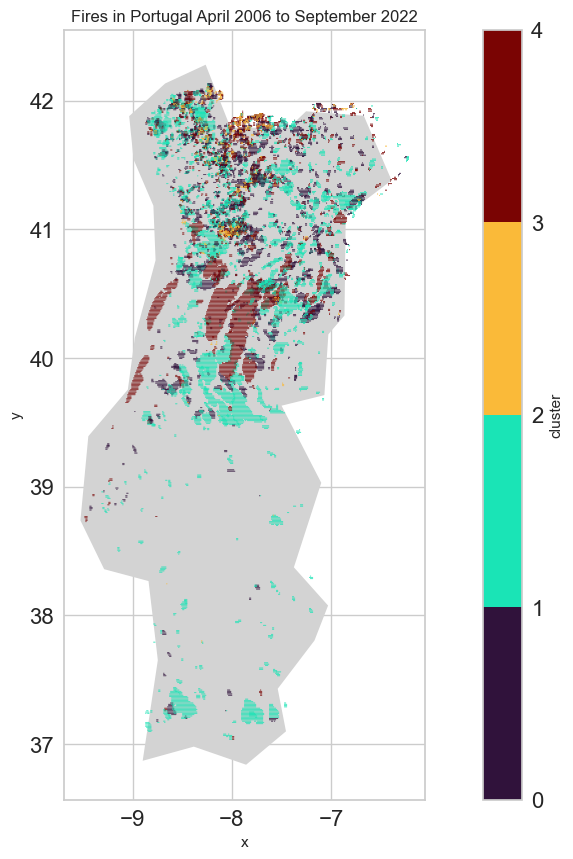

In [785]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years_4['x'] = years['x']
years_4['y'] = years['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

years_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

In [786]:
# z-score clustering
normalized_df=(years_knn-years_knn.mean())/years_knn.std()
# other clustering methods:
#[0,1]
# normalized_df=(years_knn-years_knn.min())/(years_knn.max()-years_knn.min())
#[-1, 1] normalization:
# normalized_df=(years_knn)/(years_knn.max()-years_knn.min())



normalized_df_4 = normalized_df.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(normalized_df_4)
normalized_df_4['cluster'] = kmeans.predict(normalized_df)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1833439590.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


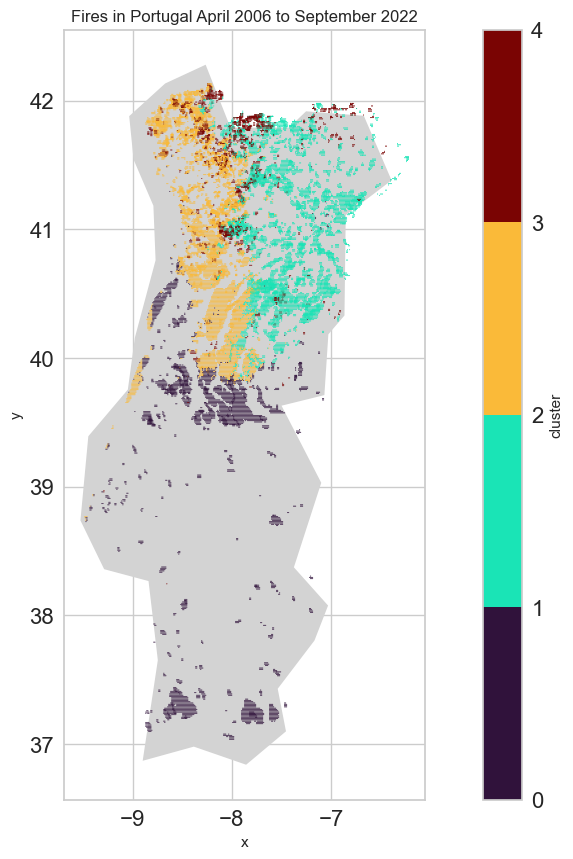

In [787]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

normalized_df_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

Visulaization of clusters show that normalized variables are clustered well with clear separation between the clusters compared to non-normalized.

##### Basic Visualizations

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\916467553.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


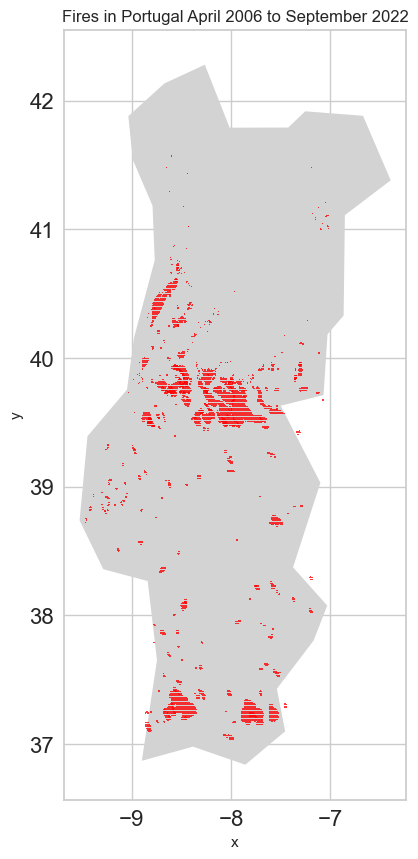

In [788]:
#visualizing first cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_0 = normalized_df_4[normalized_df_4['cluster'] == 0]


normalized_df_4_0.plot(x="x", y="y", kind="scatter", color = 'red',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\116115660.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


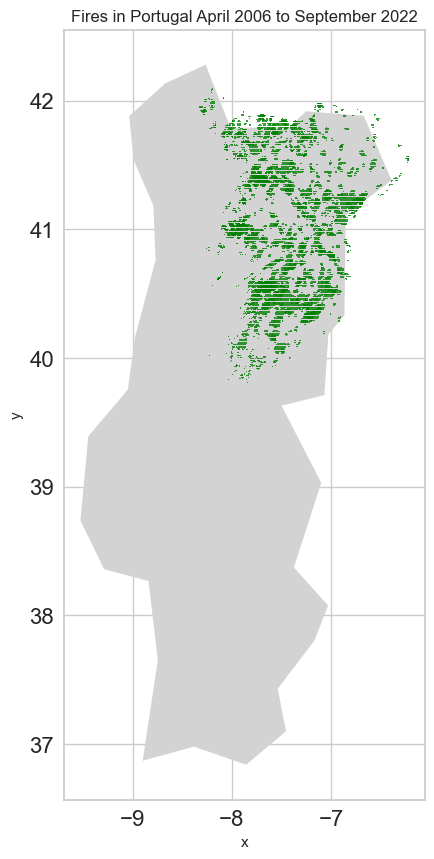

In [789]:
#visualizing second cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_1 = normalized_df_4[normalized_df_4['cluster'] == 1]


normalized_df_4_1.plot(x="x", y="y", kind="scatter", color = 'green',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1057899606.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


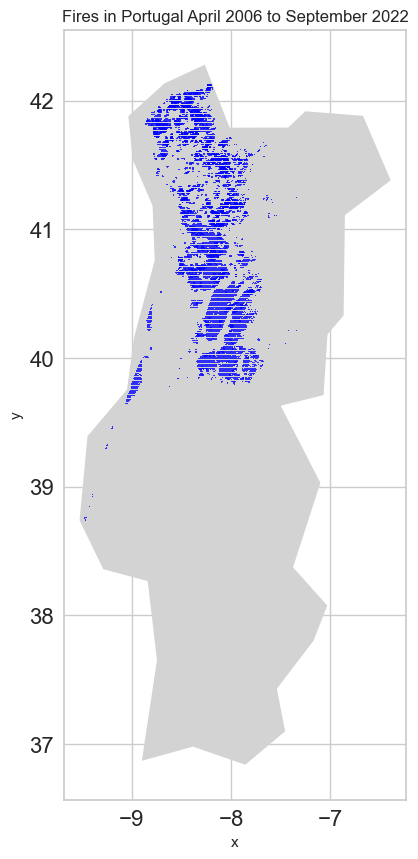

In [790]:
#visualizing third cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_2 = normalized_df_4[normalized_df_4['cluster'] == 2]


normalized_df_4_2.plot(x="x", y="y", kind="scatter", color = 'blue',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\617300168.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


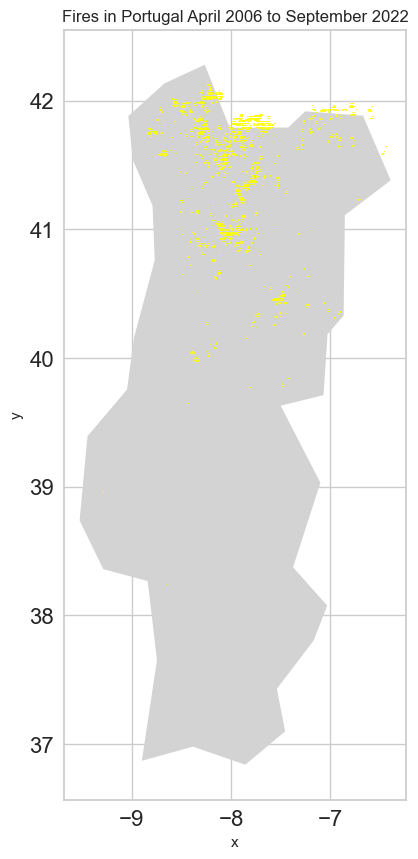

In [791]:
#visualizing fourth cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_3 = normalized_df_4[normalized_df_4['cluster'] == 3]


normalized_df_4_3.plot(x="x", y="y", kind="scatter", color = 'yellow',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

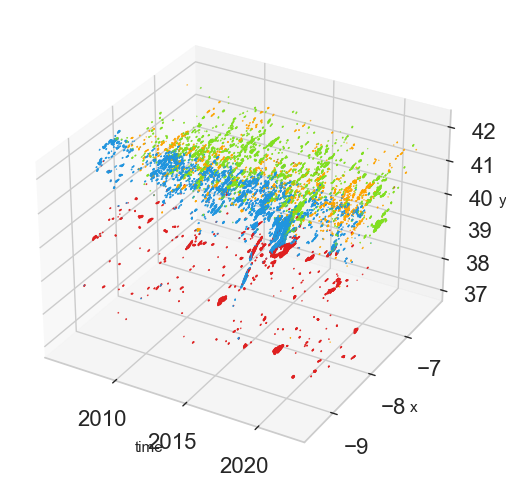

In [792]:
#3d visualization of the distribution of clusters
from mpl_toolkits.mplot3d import Axes3D  

import matplotlib.pyplot as plt
import numpy as np
viz = normalized_df_4.copy(deep = True)
from mpl_toolkits.mplot3d import Axes3D

viz['x'] = years['x']
viz['y'] = years['y']
viz['year'] = years['year']
colors2 = ['#DF2020', '#81DF20', '#2095DF', 'orange']
viz['c'] = viz.cluster.map({0:colors2[0], 1:colors2[1], 2:colors2[2], 3:colors2[3]})
fig = plt.figure(figsize=(26,6))
ax = fig.add_subplot(131, projection='3d')
ax.scatter(viz.year, viz.x, viz.y,  c=viz.c, s=0.5)
ax.set_xlabel('time')
ax.set_ylabel('x')
ax.set_zlabel('y')
plt.show()

##### Plot majority cluster

In [793]:
years_probability = years.copy(deep=True)
years_probability['cluster'] = normalized_df_4['cluster']
years_probability['x_int'] = round(years_probability['x'], 3) * 1000
years_probability['x_int'] = years_probability['x_int'].astype('int')

In [794]:
majority_cluster = years_probability.groupby(['x_int', 'y_int'])['cluster'].aggregate(pd.Series.mode)
x_int = [coordinate[0] for coordinate in majority_cluster.index]
y_int = [coordinate[1] for coordinate in majority_cluster.index]

majority = []
for val in majority_cluster.values:
    # handles edge case when the majority cluster is more than 1, so picks any of them
    if isinstance(val, np.ndarray):
        val = val[0]
    majority.append(val)
    
majority_cluster = pd.DataFrame({'x_int':x_int, 'y_int': y_int, 'cluster':majority})
majority_cluster['x'] = majority_cluster['x_int'].astype('float')
majority_cluster['x'] = majority_cluster['x']/1000
majority_cluster['y'] = majority_cluster['y_int'].astype('float')
majority_cluster['y']  = majority_cluster['y']/100
majority_cluster

,x_int,y_int,cluster,x,y
0,-9481,3875,2,-9.481,38.75
1,-9481,3876,2,-9.481,38.76
2,-9471,3872,0,-9.471,38.72
3,-9471,3873,2,-9.471,38.73
4,-9471,3874,2,-9.471,38.74
...,...,...,...,...,...
22563,-6228,4155,1,-6.228,41.55
22564,-6228,4156,1,-6.228,41.56
22565,-6218,4154,1,-6.218,41.54
22566,-6218,4155,1,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\2613347718.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


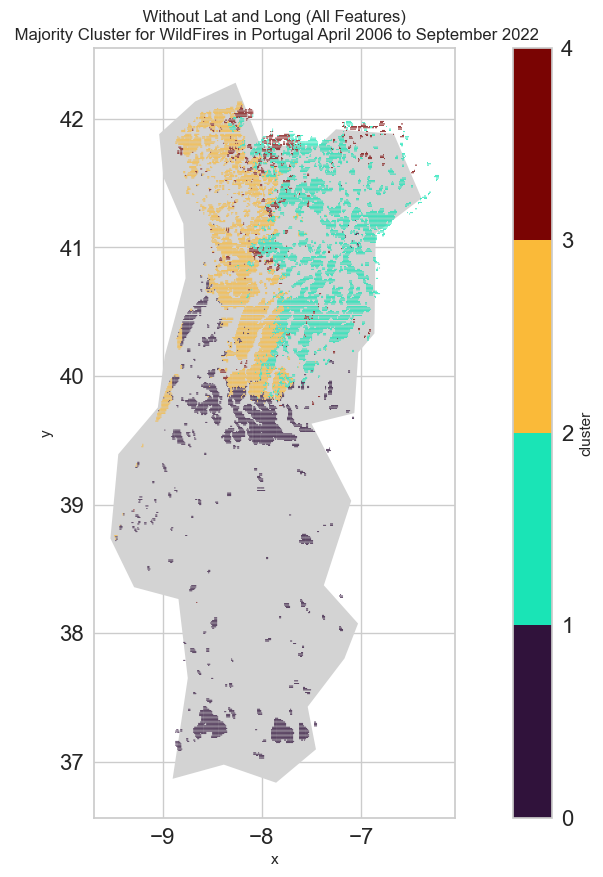

In [795]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

majority_cluster.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f" Without Lat and Long (All Features) \n Majority Cluster for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Visualize Probability of falling within a cluster

In [796]:
all_clusters = years_probability.groupby(['x_int', 'y_int'])['cluster'].value_counts()

In [797]:
Dict = {}

for idx, coordinate in enumerate(all_clusters.index):
    x_int = coordinate[0]
    y_int = coordinate[1]
    cluster = coordinate[2]
    val = all_clusters.values[idx]
    if tuple([x_int, y_int]) not in Dict:
        clusters = [0, 0, 0, 0]
        clusters[cluster] = val
        Dict[tuple([x_int, y_int])] = clusters
    else:
        Dict[tuple([x_int, y_int])][cluster] = val

x_int = []
y_int = []
cluster_1 = []
cluster_1_prob = []
cluster_2 = []
cluster_2_prob = []
cluster_3 = []
cluster_3_prob = []
cluster_4 = []
cluster_4_prob = []
total = []

for key in Dict:
    x_int.append(key[0])
    y_int.append(key[1])
    cluster_1.append(Dict[key][0])
    cluster_2.append(Dict[key][1])
    cluster_3.append(Dict[key][2])
    cluster_4.append(Dict[key][3])
    total_count = Dict[key][0] + Dict[key][1] + Dict[key][2] +Dict[key][3]
    total.append(total_count)
    cluster_1_prob.append(Dict[key][0]/total_count)
    cluster_2_prob.append(Dict[key][1]/total_count)
    cluster_3_prob.append(Dict[key][2]/total_count)
    cluster_4_prob.append(Dict[key][3]/total_count)



clusters_probablity = pd.DataFrame({'x_int': x_int, 'y_int': y_int, 'cluster1': cluster_1, 'cluster_1_probability':cluster_1_prob, 'cluster2': cluster_2, 'cluster_2_probability':cluster_2_prob, 'cluster3':cluster_3, 'cluster_3_probability':cluster_3_prob, 'cluster4':cluster_4, 'cluster_4_probability':cluster_4_prob, 'total':total})

clusters_probablity['x'] = clusters_probablity['x_int'].astype('float')
clusters_probablity['x'] = clusters_probablity['x']/1000
clusters_probablity['y'] = clusters_probablity['y_int'].astype('float')
clusters_probablity['y']  = clusters_probablity['y']/100

In [798]:
clusters_probablity

,x_int,y_int,cluster1,cluster_1_probability,cluster2,cluster_2_probability,cluster3,cluster_3_probability,cluster4,cluster_4_probability,total,x,y
0,-9481,3875,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.481,38.75
1,-9481,3876,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.481,38.76
2,-9471,3872,1,1.0,0,0.0,0,0.0,0,0.0,1,-9.471,38.72
3,-9471,3873,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.471,38.73
4,-9471,3874,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.471,38.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22563,-6228,4155,0,0.0,2,1.0,0,0.0,0,0.0,2,-6.228,41.55
22564,-6228,4156,0,0.0,1,1.0,0,0.0,0,0.0,1,-6.228,41.56
22565,-6218,4154,0,0.0,2,1.0,0,0.0,0,0.0,2,-6.218,41.54
22566,-6218,4155,0,0.0,2,1.0,0,0.0,0,0.0,2,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\182694575.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


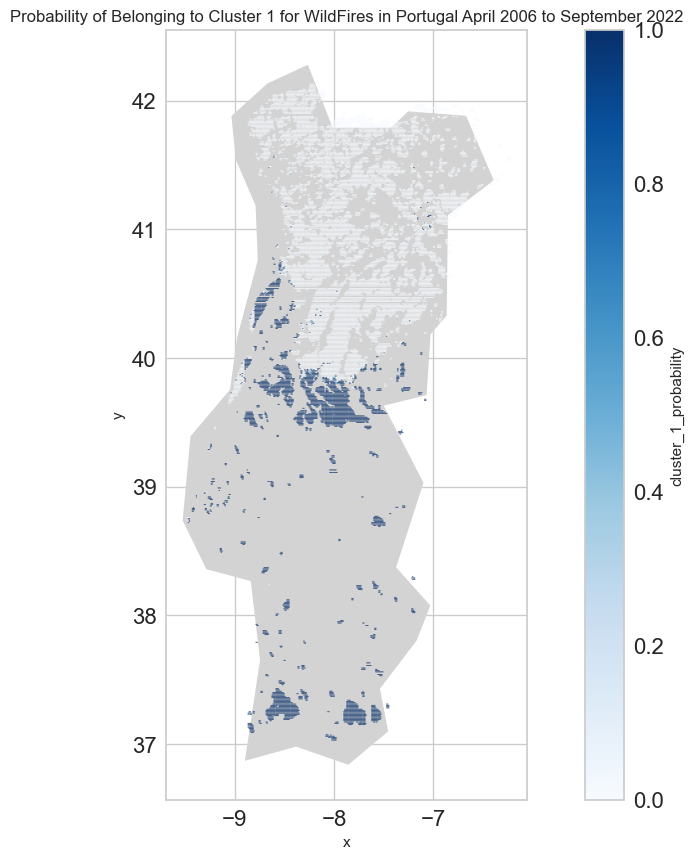

In [799]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_1_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 1 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1781413263.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


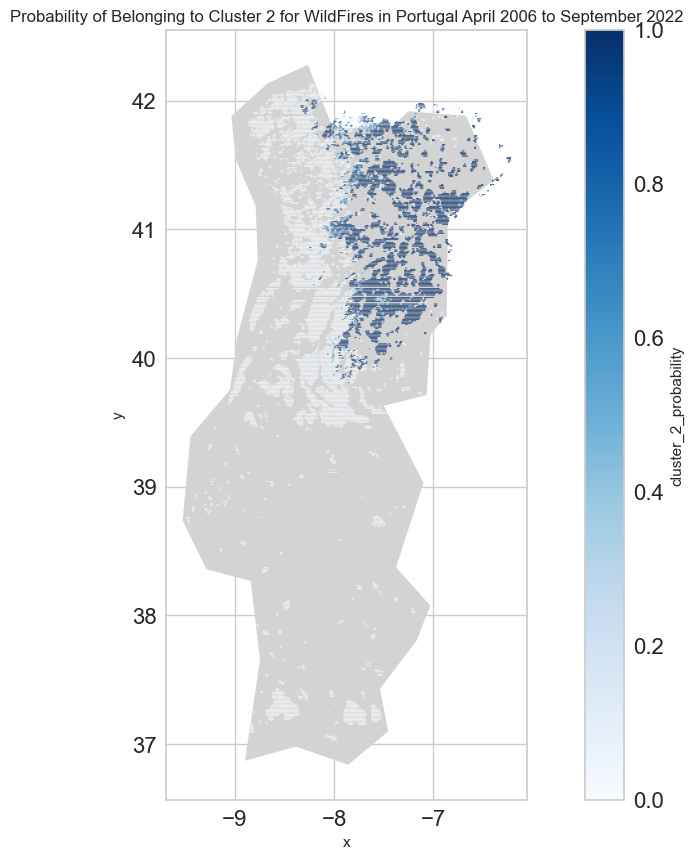

In [800]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_2_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 2 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\336700447.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


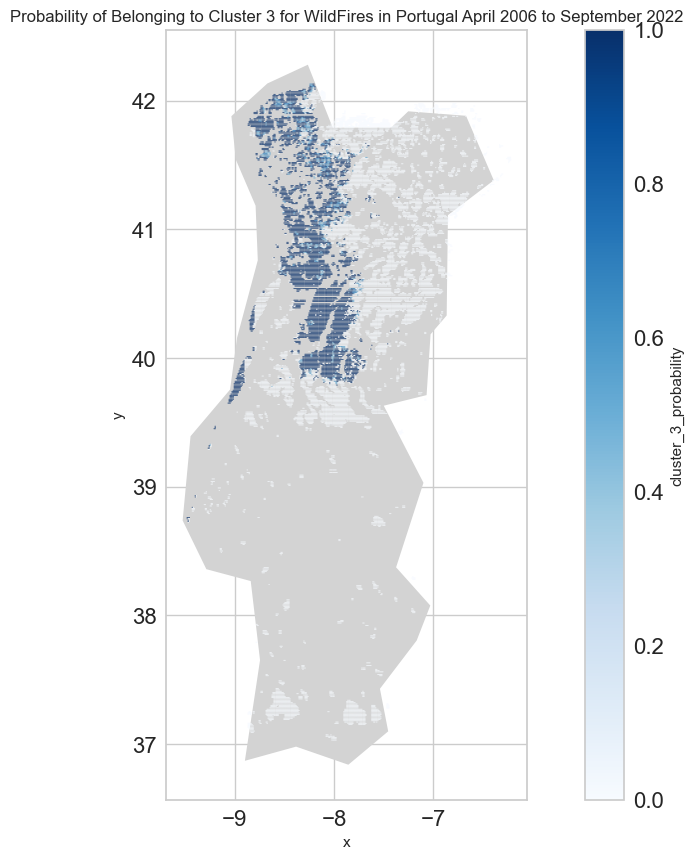

In [801]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_3_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 3 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1814191791.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


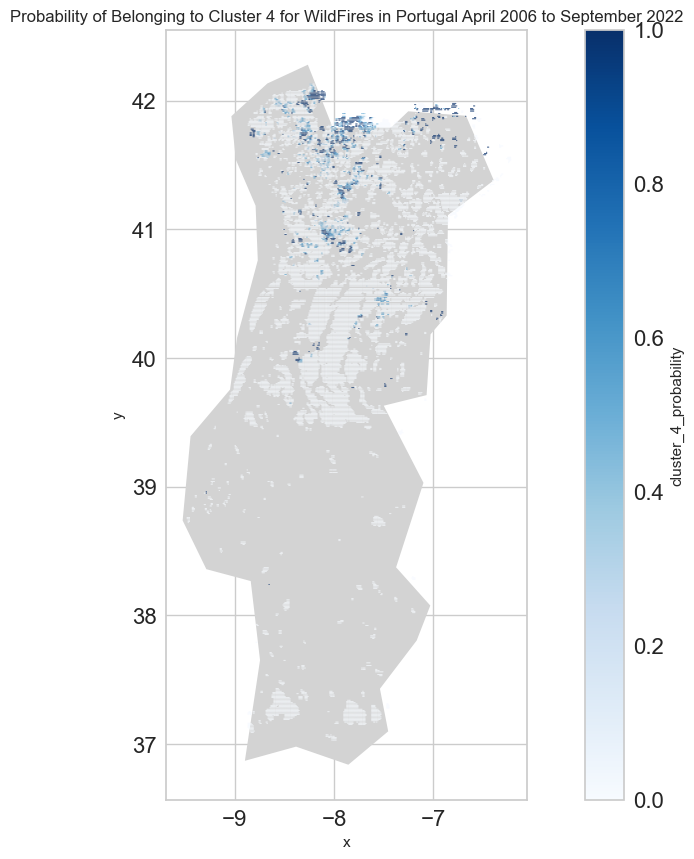

In [802]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_4_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 4 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Box Plot

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .item

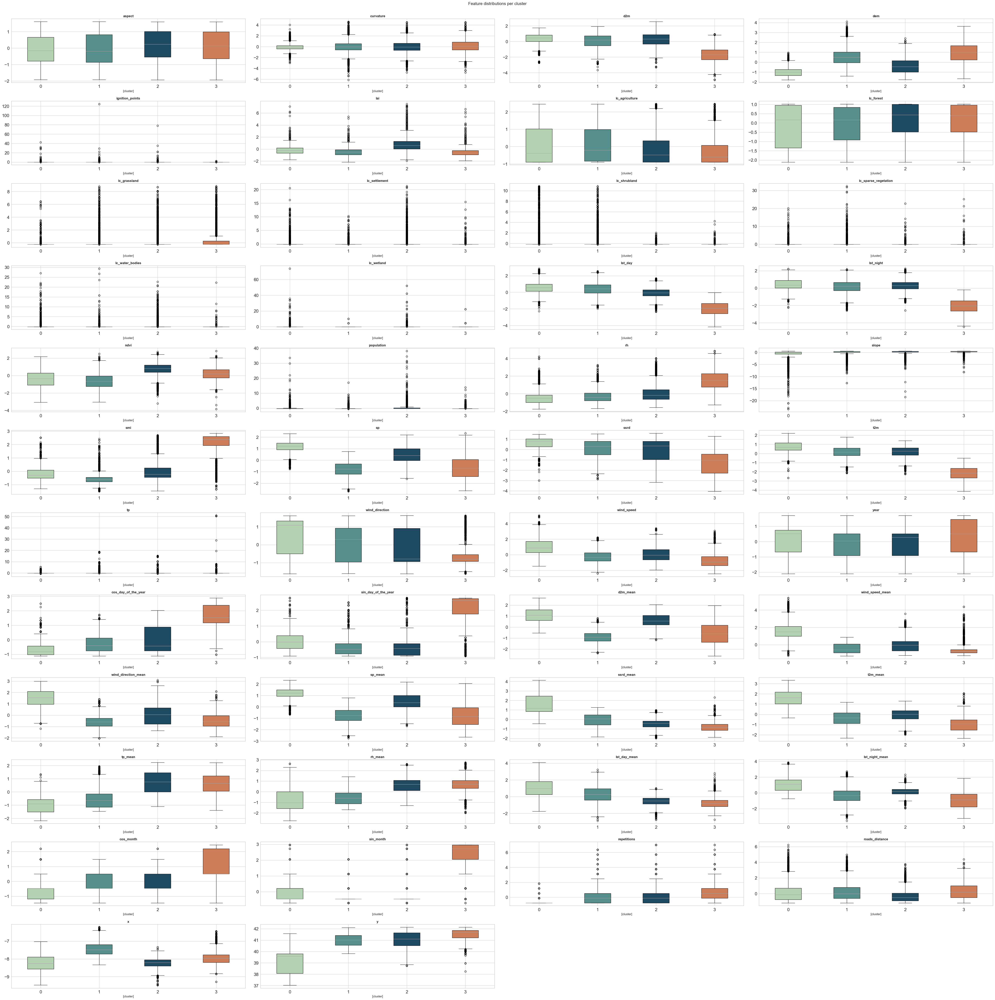

In [803]:
cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59']
normalized_df_4.columns = normalized_df_4.columns.get_level_values(0)
cols = normalized_df_4.columns.to_list()
features = cols
features.remove('cluster')
ncols = 4
nrows = len(features) // ncols + (len(features) % ncols > 0)
fig = plt.figure(figsize=(50,50))

for n, feature in enumerate(features):
    ax = plt.subplot(nrows, ncols, n + 1)
    box = normalized_df_4[[feature, 'cluster']].boxplot(by='cluster',ax=ax,return_type='both',patch_artist = True)

    for row_key, (ax,row) in box.iteritems():
        ax.set_title(feature,fontweight="bold")
        for i,box in enumerate(row['boxes']):
            box.set_facecolor(cluster_colors[i])

fig.suptitle('Feature distributions per cluster', fontsize=15, y=1)   
plt.tight_layout()
plt.show()

#### With Lat and Long (Climate Features)

In [804]:
years_knn = years.copy(deep=True)
# drop irrelevant columns
cols = [ 'time', 'day_of_the_year', 'x_int', 'y_int', 'day', 'month', 'burned_areas', 'd2m', 'lst_day', 'lst_night', 'rh', 'sp', 'ssrd', 't2m', 'tp', 'wind_speed', 'wind_direction']
years_knn = years_knn.drop(columns=cols)

#non-normalized values
years_4 = years_knn.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(years_4)
years_4['cluster'] = kmeans.predict(years_4)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


##### Normalized vs non-normalized

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1364945304.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


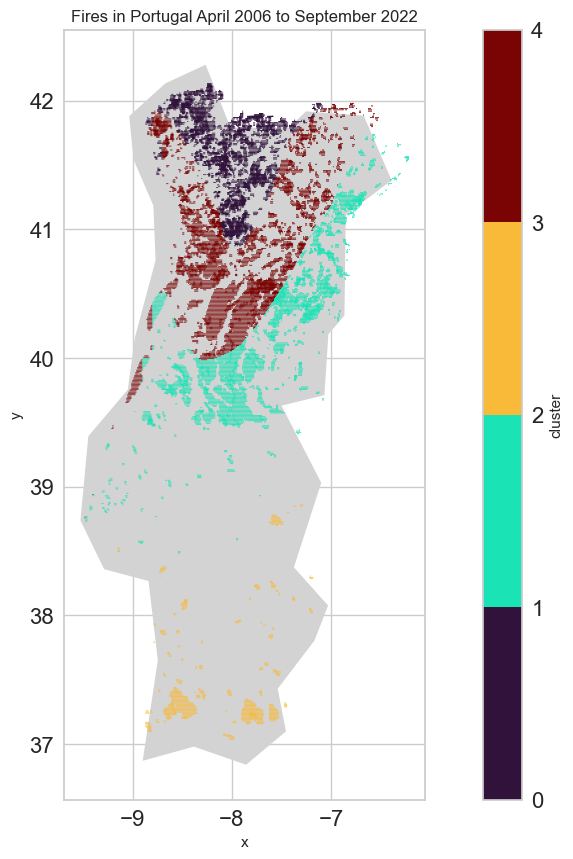

In [805]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years_4['x'] = years_4['x']
years_4['y'] = years_4['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

years_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

In [806]:
# z-score clustering
normalized_df=(years_knn-years_knn.mean())/years_knn.std()
# other clustering methods:
#[0,1]
# normalized_df=(years_knn-years_knn.min())/(years_knn.max()-years_knn.min())
#[-1, 1] normalization:
# normalized_df=(years_knn)/(years_knn.max()-years_knn.min())



normalized_df_4 = normalized_df.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(normalized_df_4)
normalized_df_4['cluster'] = kmeans.predict(normalized_df)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1833439590.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


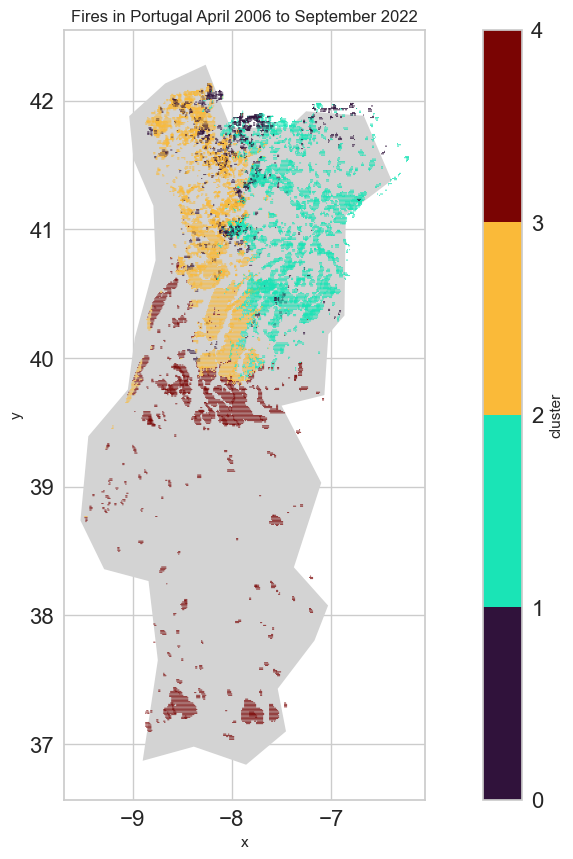

In [807]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

normalized_df_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

Visulaization of clusters show that normalized variables are clustered well with clear separation between the clusters compared to non-normalized.

##### Basic Visualizations

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\916467553.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


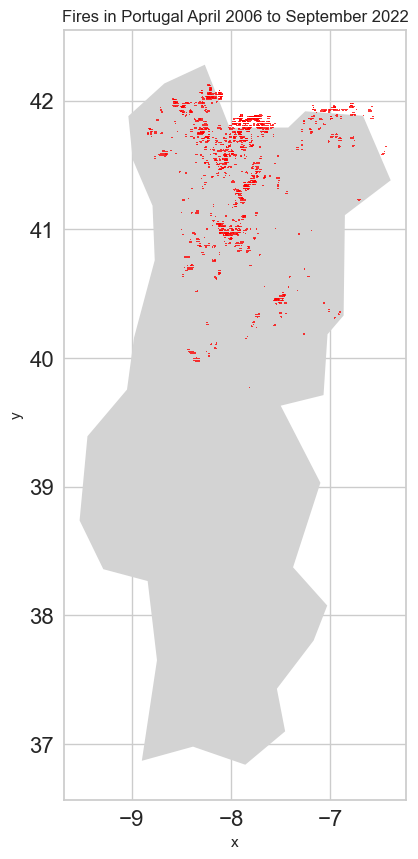

In [808]:
#visualizing first cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_0 = normalized_df_4[normalized_df_4['cluster'] == 0]


normalized_df_4_0.plot(x="x", y="y", kind="scatter", color = 'red',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\116115660.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


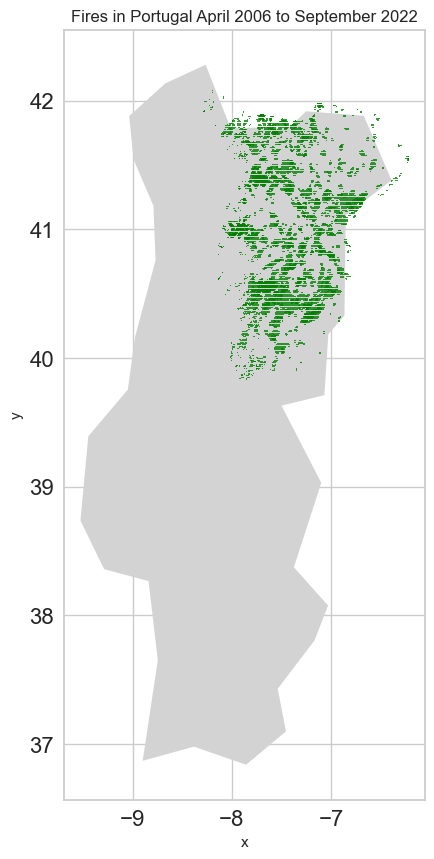

In [809]:
#visualizing second cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_1 = normalized_df_4[normalized_df_4['cluster'] == 1]


normalized_df_4_1.plot(x="x", y="y", kind="scatter", color = 'green',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1057899606.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


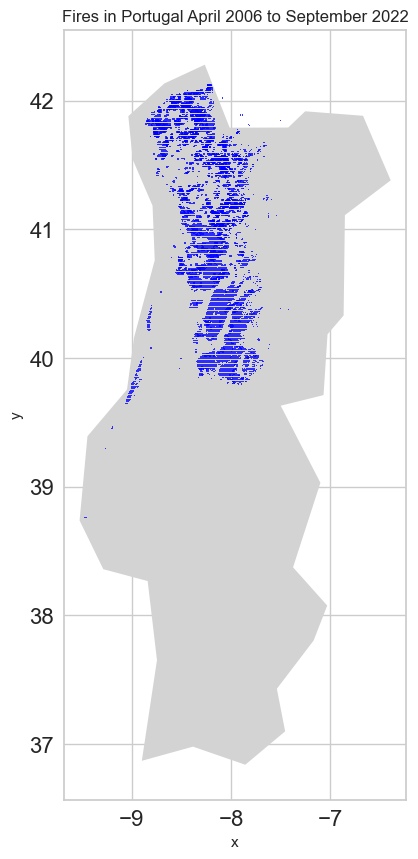

In [810]:
#visualizing third cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_2 = normalized_df_4[normalized_df_4['cluster'] == 2]


normalized_df_4_2.plot(x="x", y="y", kind="scatter", color = 'blue',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\617300168.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


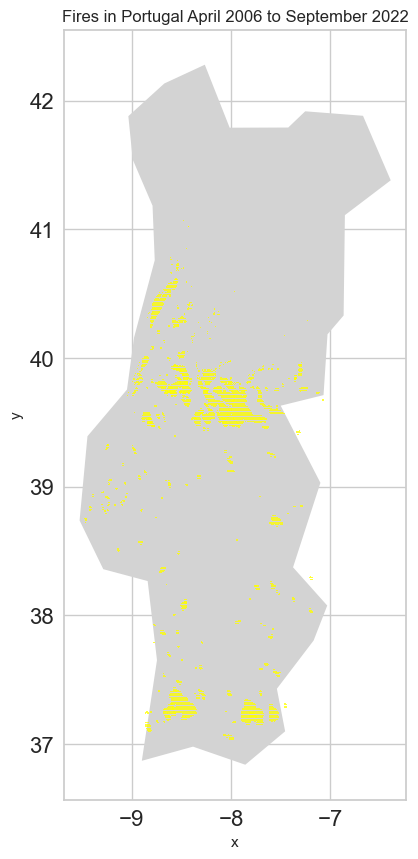

In [811]:
#visualizing fourth cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_3 = normalized_df_4[normalized_df_4['cluster'] == 3]


normalized_df_4_3.plot(x="x", y="y", kind="scatter", color = 'yellow',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

In [812]:
# extract the coordinates of portugal from shape file/ it may be used later
portugal_coordinates = json.loads(countries[countries["name"] == "Portugal"]['geometry'].to_json())['features'][0]['geometry']['coordinates'][0]
portugal_x = [coordinate[0] for coordinate in portugal_coordinates]
portugal_x = np.array(portugal_x)

portugal_y = [coordinate[1] for coordinate in portugal_coordinates]
portugal_y = np.array(portugal_y)

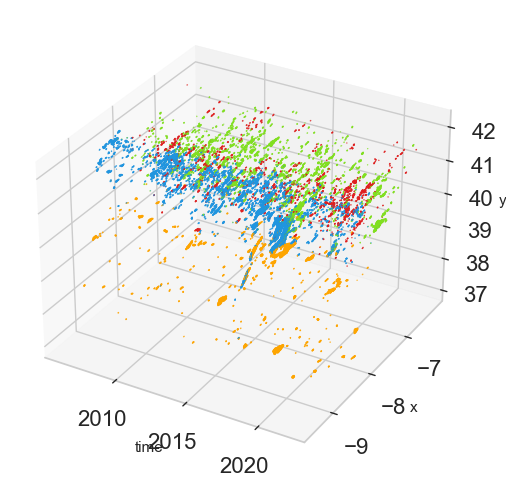

In [813]:
#3d visualization of the distribution of clusters
from mpl_toolkits.mplot3d import Axes3D  

import matplotlib.pyplot as plt
import numpy as np
viz = normalized_df_4.copy(deep = True)
from mpl_toolkits.mplot3d import Axes3D

viz['x'] = years['x']
viz['y'] = years['y']
viz['year'] = years['year']
colors2 = ['#DF2020', '#81DF20', '#2095DF', 'orange']
viz['c'] = viz.cluster.map({0:colors2[0], 1:colors2[1], 2:colors2[2], 3:colors2[3]})
fig = plt.figure(figsize=(26,6))
ax = fig.add_subplot(131, projection='3d')
ax.scatter(viz.year, viz.x, viz.y,  c=viz.c, s=0.5)
ax.set_xlabel('time')
ax.set_ylabel('x')
ax.set_zlabel('y')
plt.show()

##### Plot majority cluster

In [814]:
years_probability = years.copy(deep=True)
years_probability['cluster'] = normalized_df_4['cluster']
years_probability['x_int'] = round(years_probability['x'], 3) * 1000
years_probability['x_int'] = years_probability['x_int'].astype('int')

In [815]:
majority_cluster = years_probability.groupby(['x_int', 'y_int'])['cluster'].aggregate(pd.Series.mode)
x_int = [coordinate[0] for coordinate in majority_cluster.index]
y_int = [coordinate[1] for coordinate in majority_cluster.index]

majority = []
for val in majority_cluster.values:
    # handles edge case when the majority cluster is more than 1, so picks any of them
    if isinstance(val, np.ndarray):
        val = val[0]
    majority.append(val)
    
majority_cluster = pd.DataFrame({'x_int':x_int, 'y_int': y_int, 'cluster':majority})
majority_cluster['x'] = majority_cluster['x_int'].astype('float')
majority_cluster['x'] = majority_cluster['x']/1000
majority_cluster['y'] = majority_cluster['y_int'].astype('float')
majority_cluster['y']  = majority_cluster['y']/100
majority_cluster

,x_int,y_int,cluster,x,y
0,-9481,3875,3,-9.481,38.75
1,-9481,3876,2,-9.481,38.76
2,-9471,3872,3,-9.471,38.72
3,-9471,3873,3,-9.471,38.73
4,-9471,3874,3,-9.471,38.74
...,...,...,...,...,...
22563,-6228,4155,1,-6.228,41.55
22564,-6228,4156,1,-6.228,41.56
22565,-6218,4154,1,-6.218,41.54
22566,-6218,4155,1,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\3418375449.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


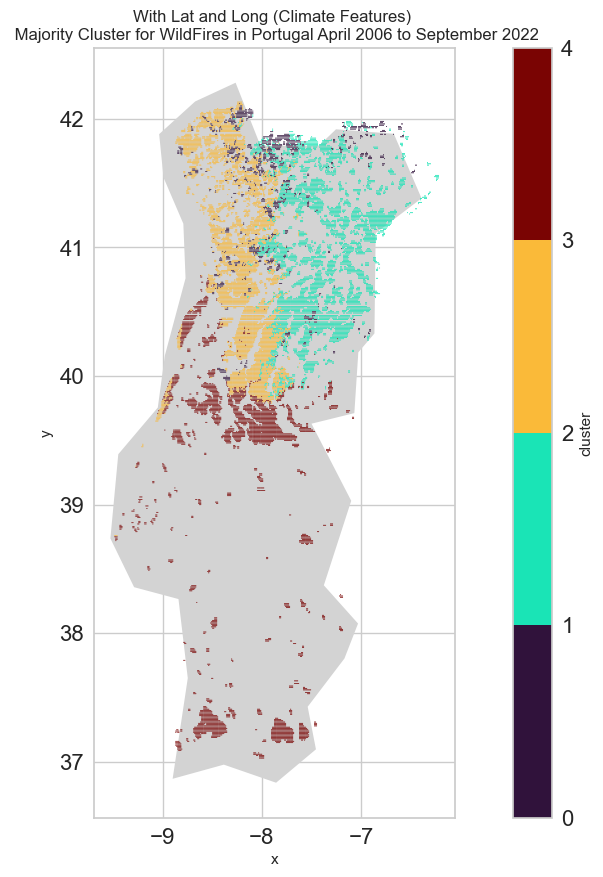

In [816]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

majority_cluster.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"With Lat and Long (Climate Features) \n Majority Cluster for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Visualize Probability of falling within a cluster

In [817]:
all_clusters = years_probability.groupby(['x_int', 'y_int'])['cluster'].value_counts()

In [818]:
Dict = {}

for idx, coordinate in enumerate(all_clusters.index):
    x_int = coordinate[0]
    y_int = coordinate[1]
    cluster = coordinate[2]
    val = all_clusters.values[idx]
    if tuple([x_int, y_int]) not in Dict:
        clusters = [0, 0, 0, 0]
        clusters[cluster] = val
        Dict[tuple([x_int, y_int])] = clusters
    else:
        Dict[tuple([x_int, y_int])][cluster] = val

x_int = []
y_int = []
cluster_1 = []
cluster_1_prob = []
cluster_2 = []
cluster_2_prob = []
cluster_3 = []
cluster_3_prob = []
cluster_4 = []
cluster_4_prob = []
total = []

for key in Dict:
    x_int.append(key[0])
    y_int.append(key[1])
    cluster_1.append(Dict[key][0])
    cluster_2.append(Dict[key][1])
    cluster_3.append(Dict[key][2])
    cluster_4.append(Dict[key][3])
    total_count = Dict[key][0] + Dict[key][1] + Dict[key][2] +Dict[key][3]
    total.append(total_count)
    cluster_1_prob.append(Dict[key][0]/total_count)
    cluster_2_prob.append(Dict[key][1]/total_count)
    cluster_3_prob.append(Dict[key][2]/total_count)
    cluster_4_prob.append(Dict[key][3]/total_count)



clusters_probablity = pd.DataFrame({'x_int': x_int, 'y_int': y_int, 'cluster1': cluster_1, 'cluster_1_probability':cluster_1_prob, 'cluster2': cluster_2, 'cluster_2_probability':cluster_2_prob, 'cluster3':cluster_3, 'cluster_3_probability':cluster_3_prob, 'cluster4':cluster_4, 'cluster_4_probability':cluster_4_prob, 'total':total})

clusters_probablity['x'] = clusters_probablity['x_int'].astype('float')
clusters_probablity['x'] = clusters_probablity['x']/1000
clusters_probablity['y'] = clusters_probablity['y_int'].astype('float')
clusters_probablity['y']  = clusters_probablity['y']/100

In [819]:
clusters_probablity

,x_int,y_int,cluster1,cluster_1_probability,cluster2,cluster_2_probability,cluster3,cluster_3_probability,cluster4,cluster_4_probability,total,x,y
0,-9481,3875,0,0.0,0,0.0,0,0.0,1,1.0,1,-9.481,38.75
1,-9481,3876,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.481,38.76
2,-9471,3872,0,0.0,0,0.0,0,0.0,1,1.0,1,-9.471,38.72
3,-9471,3873,0,0.0,0,0.0,0,0.0,1,1.0,1,-9.471,38.73
4,-9471,3874,0,0.0,0,0.0,0,0.0,1,1.0,1,-9.471,38.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22563,-6228,4155,0,0.0,2,1.0,0,0.0,0,0.0,2,-6.228,41.55
22564,-6228,4156,0,0.0,1,1.0,0,0.0,0,0.0,1,-6.228,41.56
22565,-6218,4154,0,0.0,2,1.0,0,0.0,0,0.0,2,-6.218,41.54
22566,-6218,4155,0,0.0,2,1.0,0,0.0,0,0.0,2,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\182694575.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


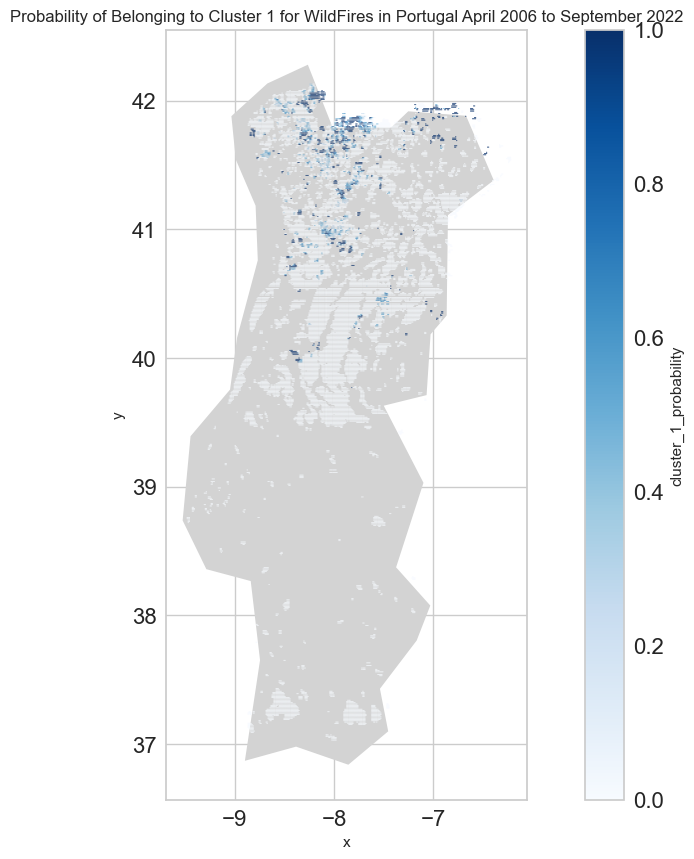

In [820]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_1_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 1 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1781413263.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


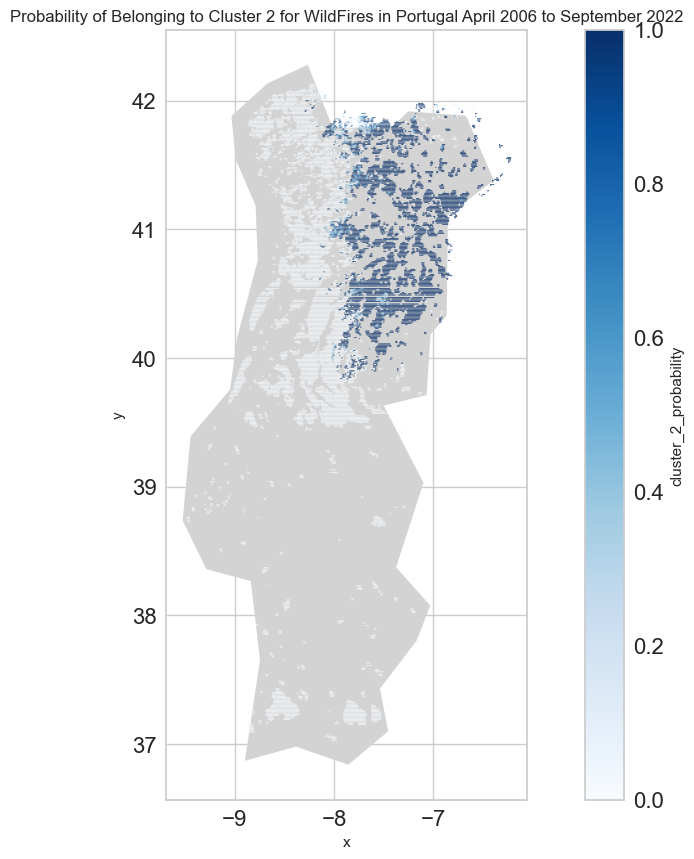

In [821]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_2_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 2 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\336700447.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


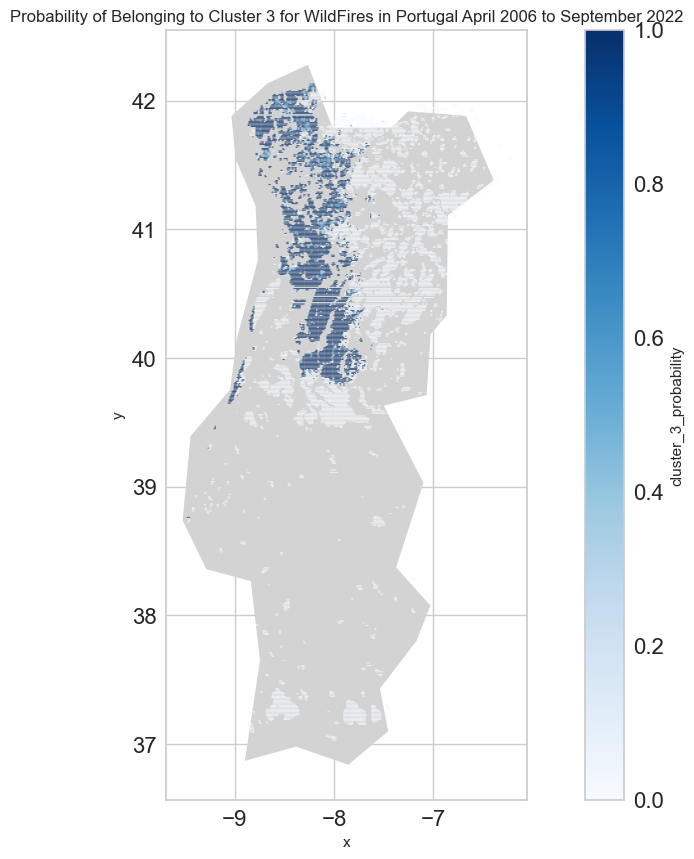

In [822]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_3_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 3 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1814191791.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


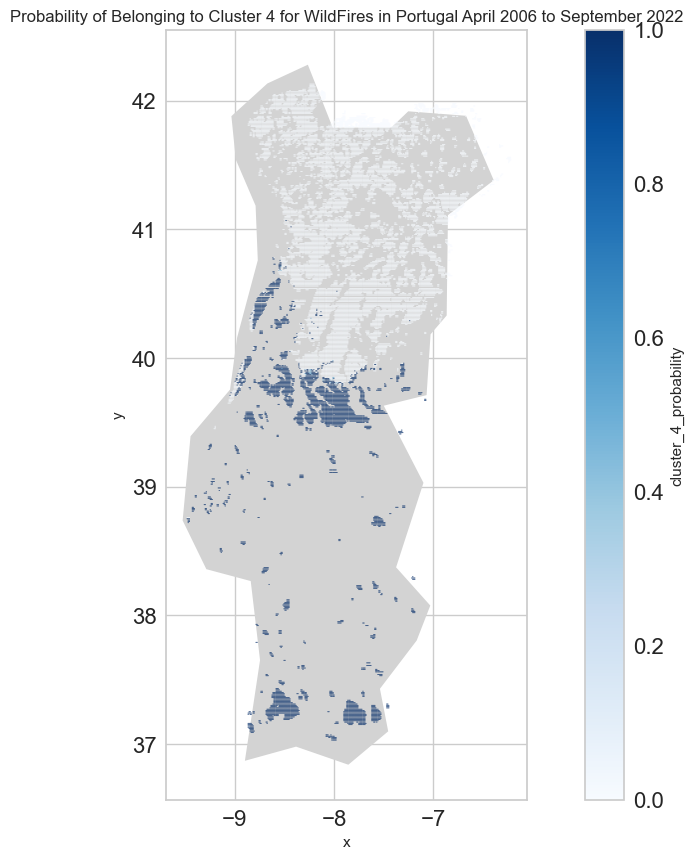

In [823]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_4_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 4 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Box Plot

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .item

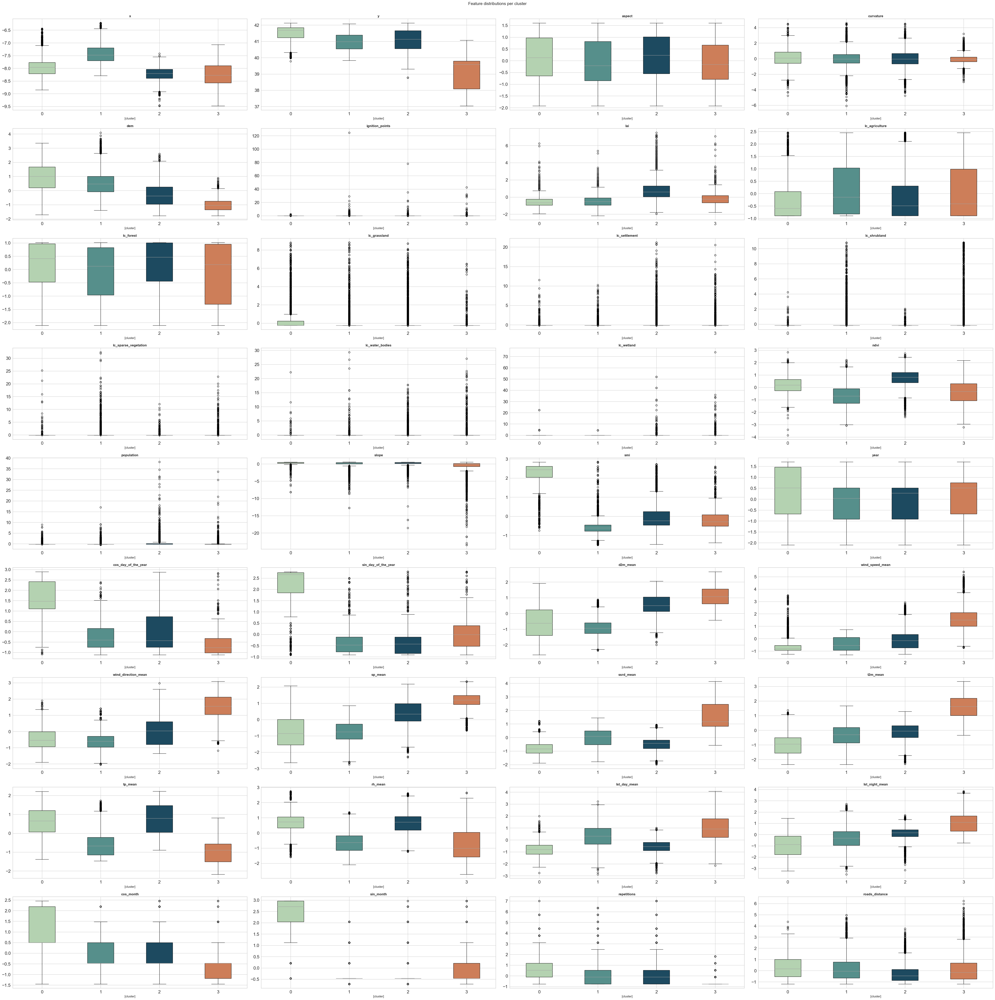

In [824]:
cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59']
normalized_df_4.columns = normalized_df_4.columns.get_level_values(0)
cols = normalized_df_4.columns.to_list()
features = cols
features.remove('cluster')
ncols = 4
nrows = len(features) // ncols + (len(features) % ncols > 0)
fig = plt.figure(figsize=(50,50))

for n, feature in enumerate(features):
    ax = plt.subplot(nrows, ncols, n + 1)
    box = normalized_df_4[[feature, 'cluster']].boxplot(by='cluster',ax=ax,return_type='both',patch_artist = True)

    for row_key, (ax,row) in box.iteritems():
        ax.set_title(feature,fontweight="bold")
        for i,box in enumerate(row['boxes']):
            box.set_facecolor(cluster_colors[i])

fig.suptitle('Feature distributions per cluster', fontsize=15, y=1)   
plt.tight_layout()
plt.show()

#### Without Lat and Long (Climate Features)

In [825]:
years_knn = years.copy(deep=True)
# drop irrelevant columns
cols = [ 'x', 'y', 'time', 'day_of_the_year', 'x_int', 'y_int', 'day', 'month', 'burned_areas', 'd2m', 'lst_day', 'lst_night', 'rh', 'sp', 'ssrd', 't2m', 'tp', 'wind_speed', 'wind_direction']
years_knn = years_knn.drop(columns=cols)

In [826]:
#non-normalized values
years_4 = years_knn.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(years_4)
years_4['cluster'] = kmeans.predict(years_4)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


##### Normalized vs non-normalized

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\71734706.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


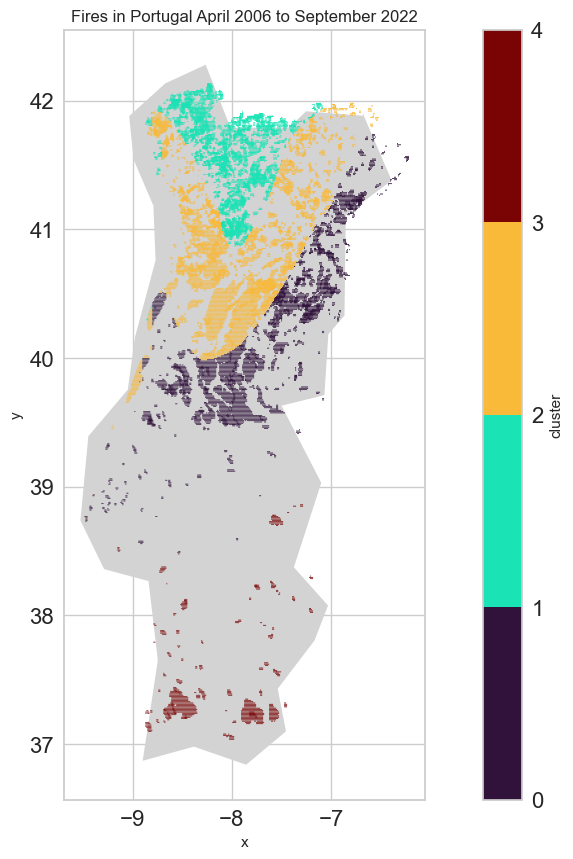

In [827]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years_4['x'] = years['x']
years_4['y'] = years['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

years_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

In [828]:
# z-score clustering
normalized_df=(years_knn-years_knn.mean())/years_knn.std()
# other clustering methods:
#[0,1]
# normalized_df=(years_knn-years_knn.min())/(years_knn.max()-years_knn.min())
#[-1, 1] normalization:
# normalized_df=(years_knn)/(years_knn.max()-years_knn.min())



normalized_df_4 = normalized_df.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(normalized_df_4)
normalized_df_4['cluster'] = kmeans.predict(normalized_df)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1833439590.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


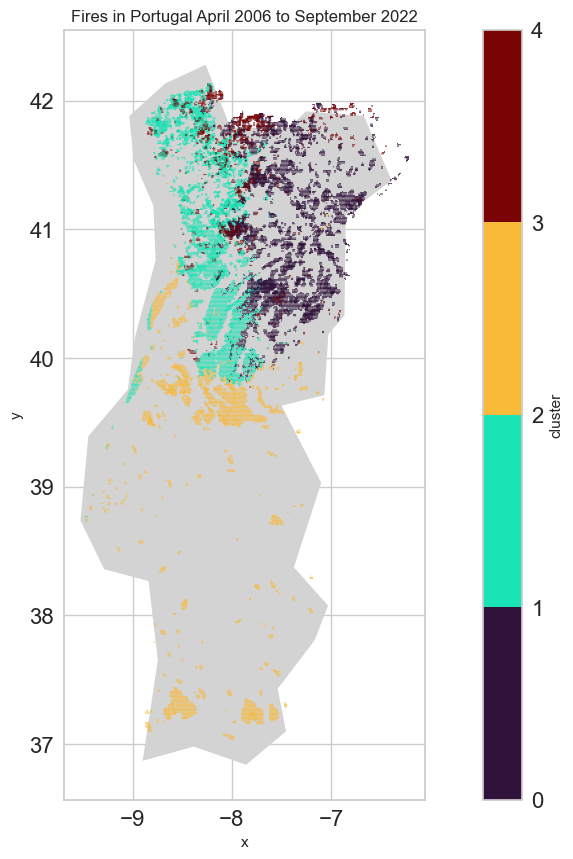

In [829]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

normalized_df_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

Visulaization of clusters show that normalized variables are clustered well with clear separation between the clusters compared to non-normalized.

##### Basic Visualizations

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\916467553.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


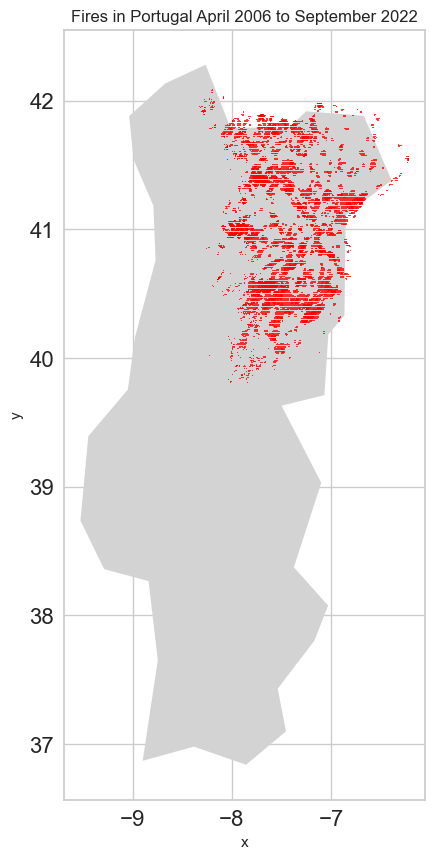

In [830]:
#visualizing first cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_0 = normalized_df_4[normalized_df_4['cluster'] == 0]


normalized_df_4_0.plot(x="x", y="y", kind="scatter", color = 'red',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\116115660.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


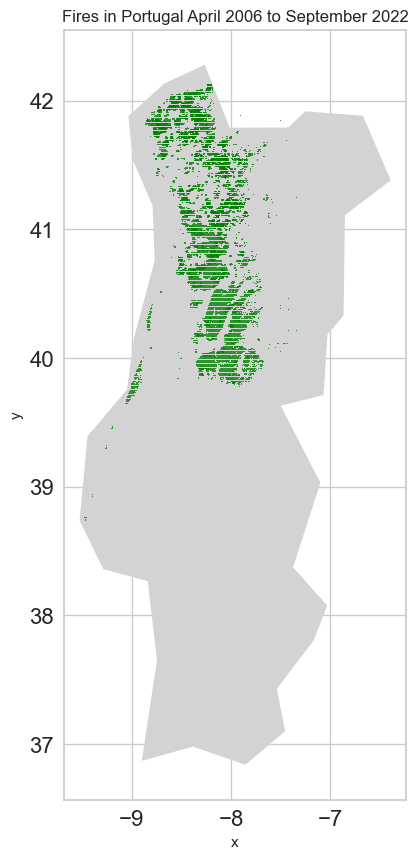

In [831]:
#visualizing second cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_1 = normalized_df_4[normalized_df_4['cluster'] == 1]


normalized_df_4_1.plot(x="x", y="y", kind="scatter", color = 'green',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1057899606.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


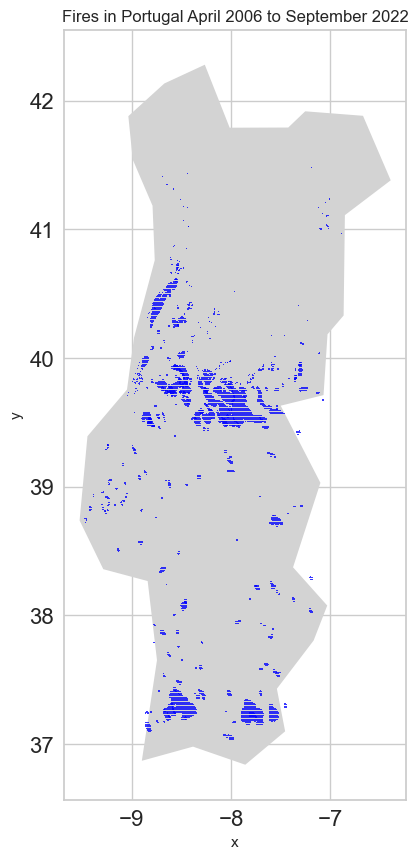

In [832]:
#visualizing third cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_2 = normalized_df_4[normalized_df_4['cluster'] == 2]


normalized_df_4_2.plot(x="x", y="y", kind="scatter", color = 'blue',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\617300168.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


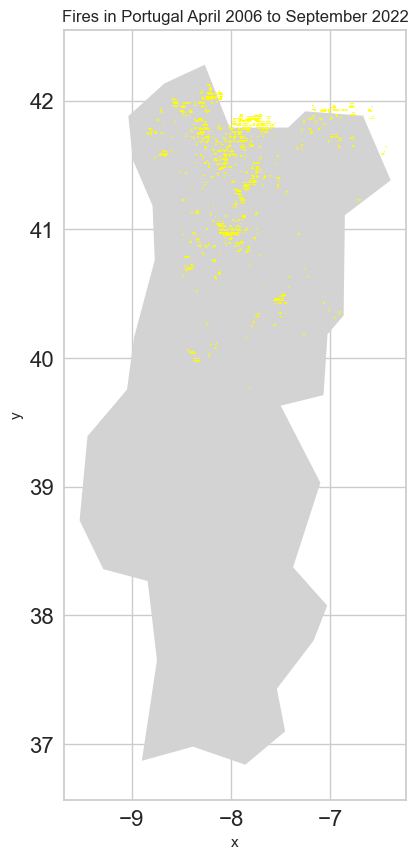

In [833]:
#visualizing fourth cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_3 = normalized_df_4[normalized_df_4['cluster'] == 3]


normalized_df_4_3.plot(x="x", y="y", kind="scatter", color = 'yellow',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

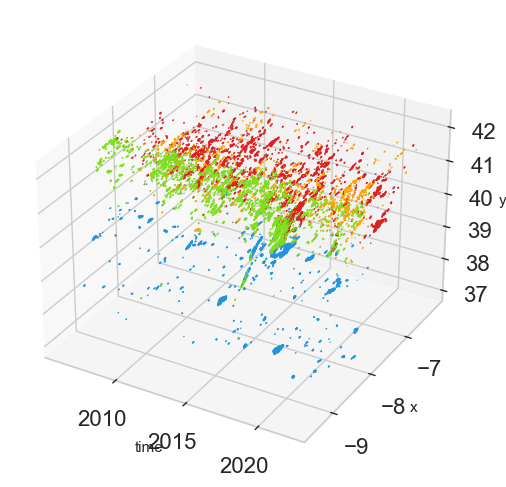

In [834]:
#3d visualization of the distribution of clusters
from mpl_toolkits.mplot3d import Axes3D  

import matplotlib.pyplot as plt
import numpy as np
viz = normalized_df_4.copy(deep = True)
from mpl_toolkits.mplot3d import Axes3D

viz['x'] = years['x']
viz['y'] = years['y']
viz['year'] = years['year']
colors2 = ['#DF2020', '#81DF20', '#2095DF', 'orange']
viz['c'] = viz.cluster.map({0:colors2[0], 1:colors2[1], 2:colors2[2], 3:colors2[3]})
fig = plt.figure(figsize=(26,6))
ax = fig.add_subplot(131, projection='3d')
ax.scatter(viz.year, viz.x, viz.y,  c=viz.c, s=0.5)
ax.set_xlabel('time')
ax.set_ylabel('x')
ax.set_zlabel('y')
plt.show()

##### Plot majority cluster

In [835]:
years_probability = years.copy(deep=True)
years_probability['cluster'] = normalized_df_4['cluster']
years_probability['x_int'] = round(years_probability['x'], 3) * 1000
years_probability['x_int'] = years_probability['x_int'].astype('int')

In [836]:
majority_cluster = years_probability.groupby(['x_int', 'y_int'])['cluster'].aggregate(pd.Series.mode)
x_int = [coordinate[0] for coordinate in majority_cluster.index]
y_int = [coordinate[1] for coordinate in majority_cluster.index]

majority = []
for val in majority_cluster.values:
    # handles edge case when the majority cluster is more than 1, so picks any of them
    if isinstance(val, np.ndarray):
        val = val[0]
    majority.append(val)
    
majority_cluster = pd.DataFrame({'x_int':x_int, 'y_int': y_int, 'cluster':majority})
majority_cluster['x'] = majority_cluster['x_int'].astype('float')
majority_cluster['x'] = majority_cluster['x']/1000
majority_cluster['y'] = majority_cluster['y_int'].astype('float')
majority_cluster['y']  = majority_cluster['y']/100
majority_cluster

,x_int,y_int,cluster,x,y
0,-9481,3875,2,-9.481,38.75
1,-9481,3876,1,-9.481,38.76
2,-9471,3872,2,-9.471,38.72
3,-9471,3873,1,-9.471,38.73
4,-9471,3874,1,-9.471,38.74
...,...,...,...,...,...
22563,-6228,4155,0,-6.228,41.55
22564,-6228,4156,0,-6.228,41.56
22565,-6218,4154,0,-6.218,41.54
22566,-6218,4155,0,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\3273076331.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


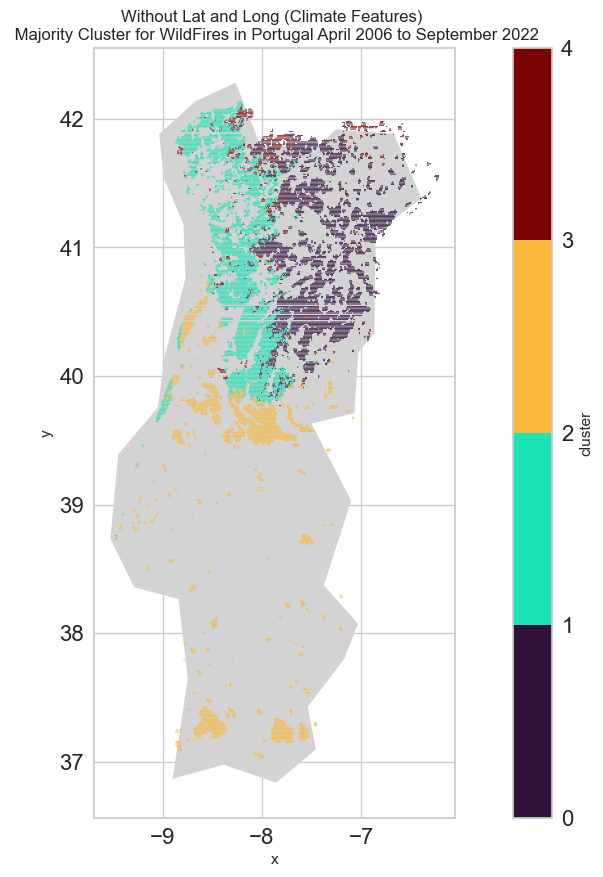

In [837]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

majority_cluster.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Without Lat and Long (Climate Features) \n Majority Cluster for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Visualize Probability of falling within a cluster

In [838]:
all_clusters = years_probability.groupby(['x_int', 'y_int'])['cluster'].value_counts()

In [839]:
Dict = {}

for idx, coordinate in enumerate(all_clusters.index):
    x_int = coordinate[0]
    y_int = coordinate[1]
    cluster = coordinate[2]
    val = all_clusters.values[idx]
    if tuple([x_int, y_int]) not in Dict:
        clusters = [0, 0, 0, 0]
        clusters[cluster] = val
        Dict[tuple([x_int, y_int])] = clusters
    else:
        Dict[tuple([x_int, y_int])][cluster] = val

x_int = []
y_int = []
cluster_1 = []
cluster_1_prob = []
cluster_2 = []
cluster_2_prob = []
cluster_3 = []
cluster_3_prob = []
cluster_4 = []
cluster_4_prob = []
total = []

for key in Dict:
    x_int.append(key[0])
    y_int.append(key[1])
    cluster_1.append(Dict[key][0])
    cluster_2.append(Dict[key][1])
    cluster_3.append(Dict[key][2])
    cluster_4.append(Dict[key][3])
    total_count = Dict[key][0] + Dict[key][1] + Dict[key][2] +Dict[key][3]
    total.append(total_count)
    cluster_1_prob.append(Dict[key][0]/total_count)
    cluster_2_prob.append(Dict[key][1]/total_count)
    cluster_3_prob.append(Dict[key][2]/total_count)
    cluster_4_prob.append(Dict[key][3]/total_count)



clusters_probablity = pd.DataFrame({'x_int': x_int, 'y_int': y_int, 'cluster1': cluster_1, 'cluster_1_probability':cluster_1_prob, 'cluster2': cluster_2, 'cluster_2_probability':cluster_2_prob, 'cluster3':cluster_3, 'cluster_3_probability':cluster_3_prob, 'cluster4':cluster_4, 'cluster_4_probability':cluster_4_prob, 'total':total})

clusters_probablity['x'] = clusters_probablity['x_int'].astype('float')
clusters_probablity['x'] = clusters_probablity['x']/1000
clusters_probablity['y'] = clusters_probablity['y_int'].astype('float')
clusters_probablity['y']  = clusters_probablity['y']/100

In [840]:
clusters_probablity

,x_int,y_int,cluster1,cluster_1_probability,cluster2,cluster_2_probability,cluster3,cluster_3_probability,cluster4,cluster_4_probability,total,x,y
0,-9481,3875,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.481,38.75
1,-9481,3876,0,0.0,1,1.0,0,0.0,0,0.0,1,-9.481,38.76
2,-9471,3872,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.471,38.72
3,-9471,3873,0,0.0,1,1.0,0,0.0,0,0.0,1,-9.471,38.73
4,-9471,3874,0,0.0,1,1.0,0,0.0,0,0.0,1,-9.471,38.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22563,-6228,4155,2,1.0,0,0.0,0,0.0,0,0.0,2,-6.228,41.55
22564,-6228,4156,1,1.0,0,0.0,0,0.0,0,0.0,1,-6.228,41.56
22565,-6218,4154,2,1.0,0,0.0,0,0.0,0,0.0,2,-6.218,41.54
22566,-6218,4155,2,1.0,0,0.0,0,0.0,0,0.0,2,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\182694575.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


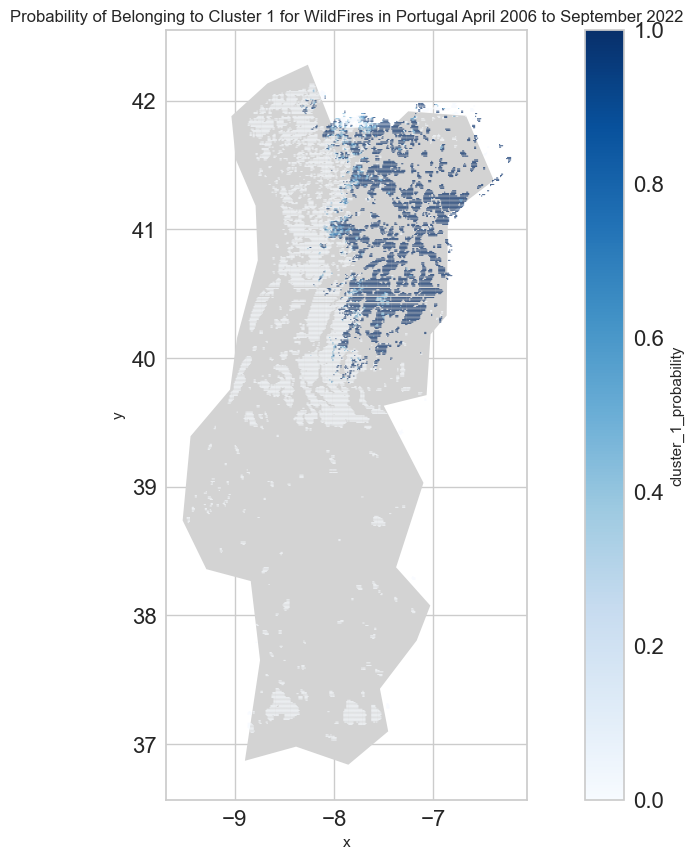

In [841]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_1_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 1 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1781413263.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


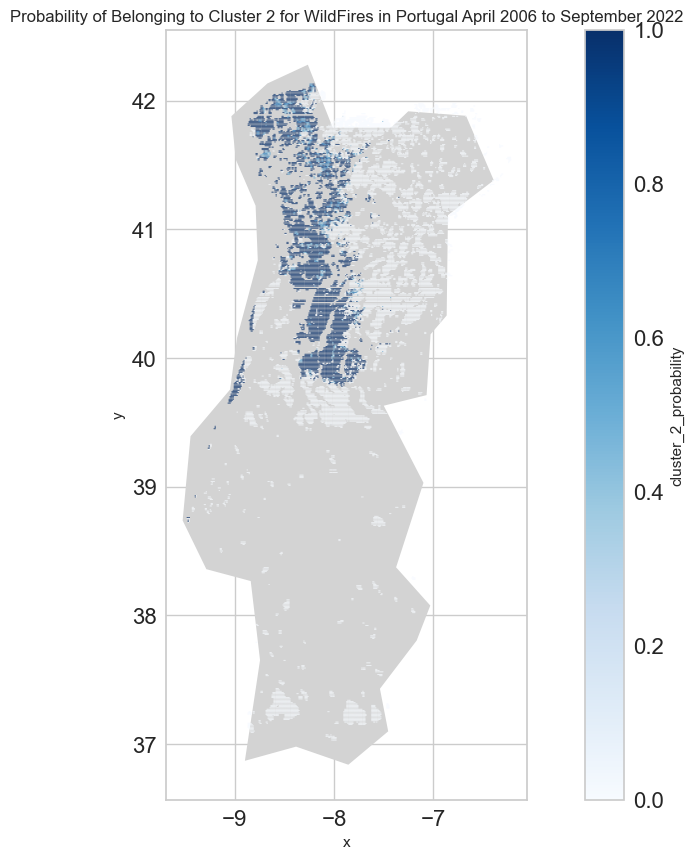

In [842]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_2_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 2 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\336700447.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


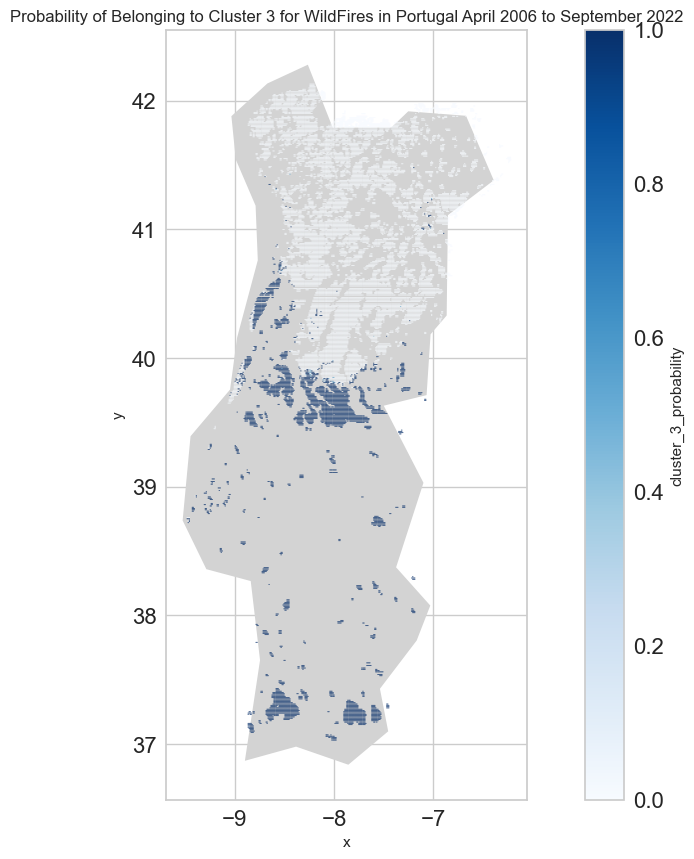

In [843]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_3_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 3 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1814191791.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


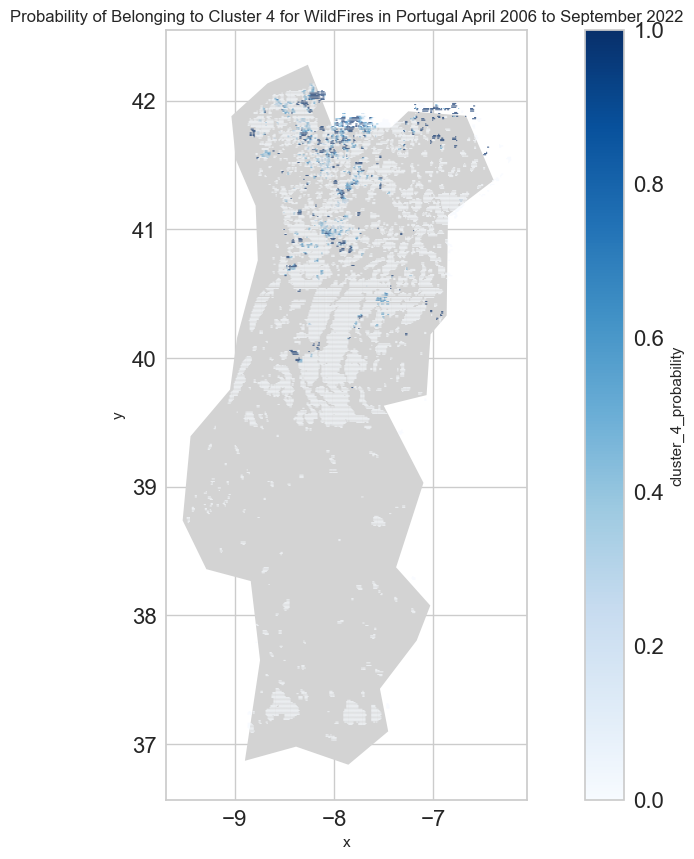

In [844]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_4_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 4 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Box Plot

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .item

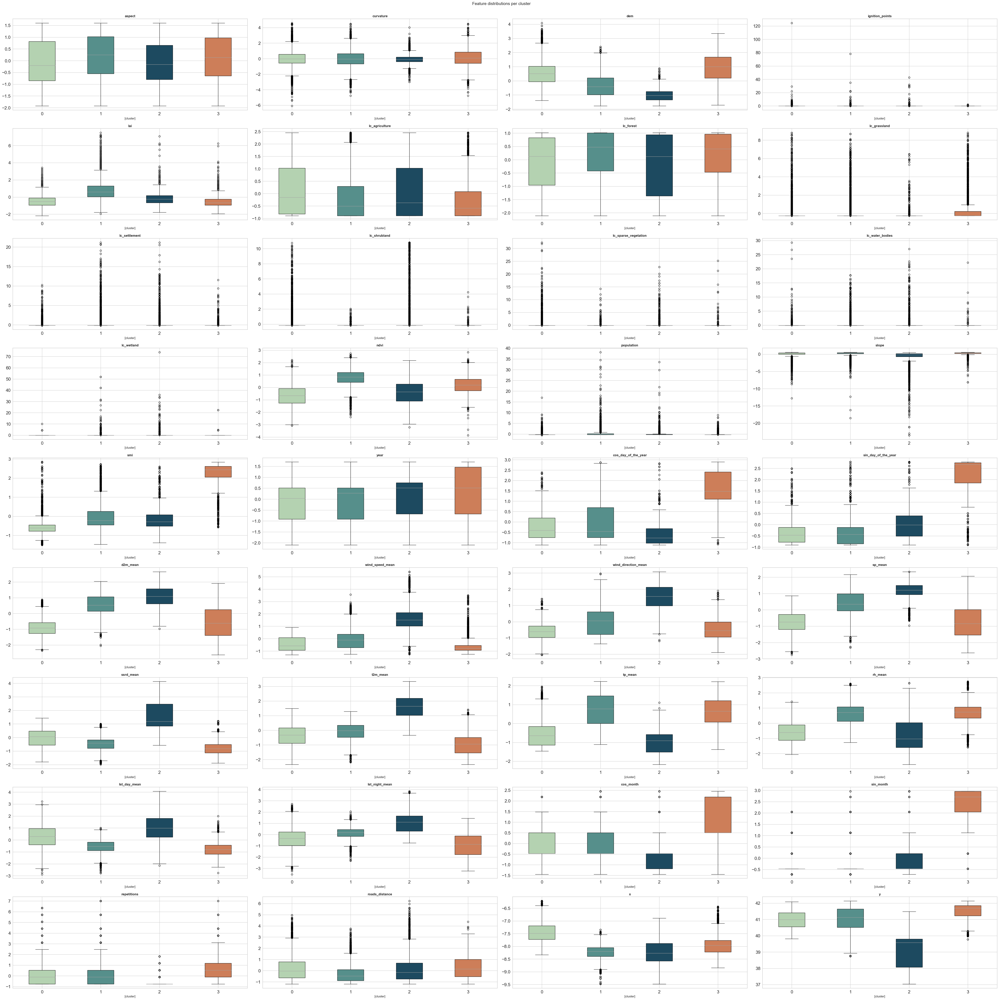

In [845]:
cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59']
normalized_df_4.columns = normalized_df_4.columns.get_level_values(0)
cols = normalized_df_4.columns.to_list()
features = cols
features.remove('cluster')
ncols = 4
nrows = len(features) // ncols + (len(features) % ncols > 0)
fig = plt.figure(figsize=(50,50))

for n, feature in enumerate(features):
    ax = plt.subplot(nrows, ncols, n + 1)
    box = normalized_df_4[[feature, 'cluster']].boxplot(by='cluster',ax=ax,return_type='both',patch_artist = True)

    for row_key, (ax,row) in box.iteritems():
        ax.set_title(feature,fontweight="bold")
        for i,box in enumerate(row['boxes']):
            box.set_facecolor(cluster_colors[i])

fig.suptitle('Feature distributions per cluster', fontsize=15, y=1)   
plt.tight_layout()
plt.show()

#### With Lat and Long (Meteorolgical Features)

In [846]:
years_knn = years.copy(deep=True)
# drop irrelevant columns
cols = [ 'time', 'day_of_the_year', 'x_int', 'y_int', 'day', 'month', 'burned_areas', 'd2m_mean', 'lst_day_mean', 'lst_night_mean', 'rh_mean', 'sp_mean', 'ssrd_mean', 't2m_mean', 'tp_mean', 'wind_speed_mean', 'wind_direction_mean']
years_knn = years_knn.drop(columns=cols)

#non-normalized values
years_4 = years_knn.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(years_4)
years_4['cluster'] = kmeans.predict(years_4)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


##### Normalized vs non-normalized

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1364945304.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


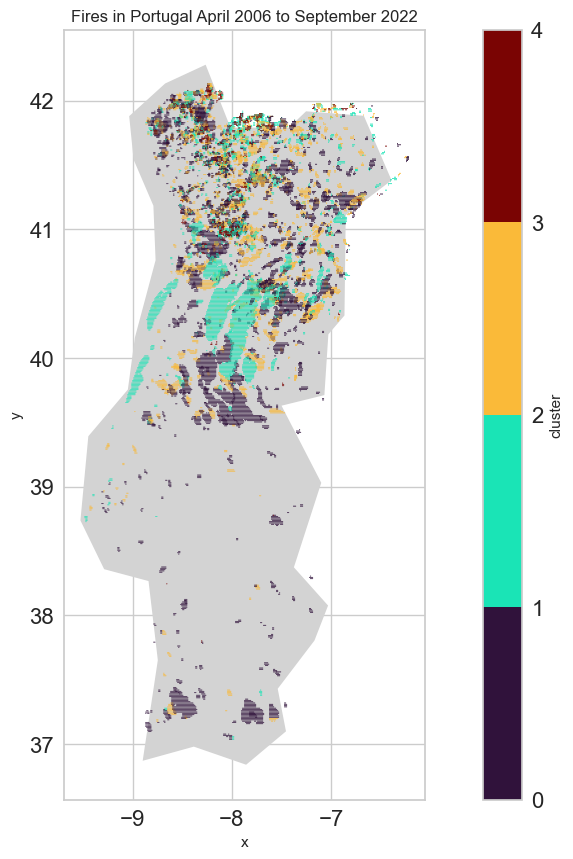

In [847]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years_4['x'] = years_4['x']
years_4['y'] = years_4['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

years_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

In [848]:
# z-score clustering
normalized_df=(years_knn-years_knn.mean())/years_knn.std()
# other clustering methods:
#[0,1]
# normalized_df=(years_knn-years_knn.min())/(years_knn.max()-years_knn.min())
#[-1, 1] normalization:
# normalized_df=(years_knn)/(years_knn.max()-years_knn.min())



normalized_df_4 = normalized_df.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(normalized_df_4)
normalized_df_4['cluster'] = kmeans.predict(normalized_df)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1833439590.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


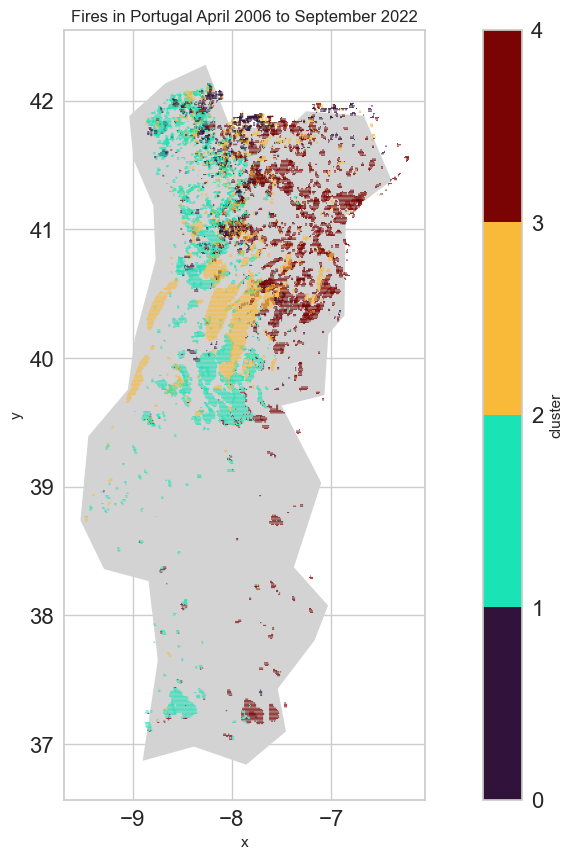

In [849]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

normalized_df_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

Visulaization of clusters show that normalized variables are clustered well with clear separation between the clusters compared to non-normalized.

##### Basic Visualizations

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\916467553.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


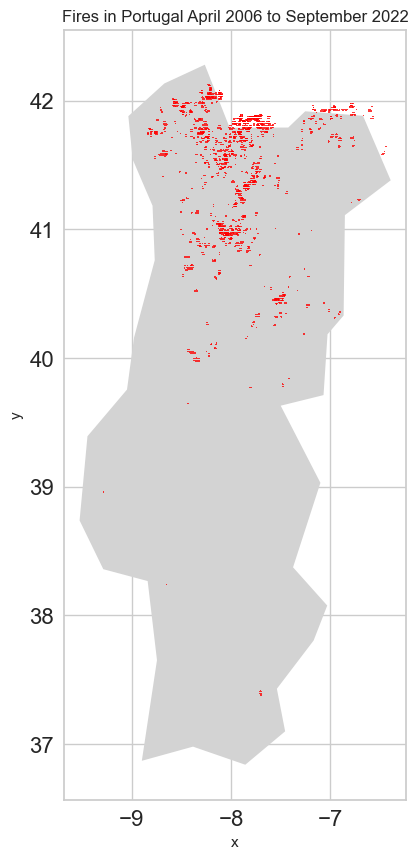

In [850]:
#visualizing first cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_0 = normalized_df_4[normalized_df_4['cluster'] == 0]


normalized_df_4_0.plot(x="x", y="y", kind="scatter", color = 'red',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\116115660.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


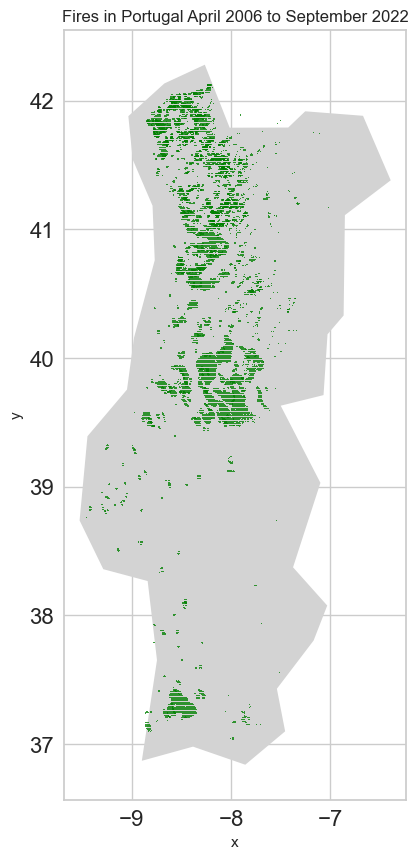

In [851]:
#visualizing second cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_1 = normalized_df_4[normalized_df_4['cluster'] == 1]


normalized_df_4_1.plot(x="x", y="y", kind="scatter", color = 'green',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1057899606.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


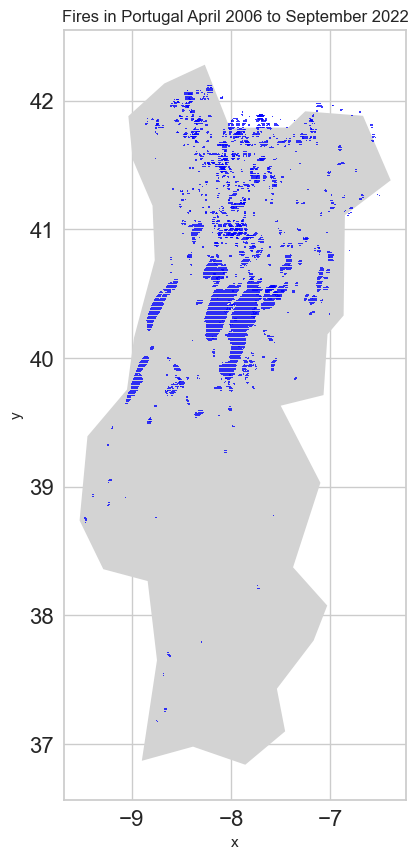

In [852]:
#visualizing third cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_2 = normalized_df_4[normalized_df_4['cluster'] == 2]


normalized_df_4_2.plot(x="x", y="y", kind="scatter", color = 'blue',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\617300168.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


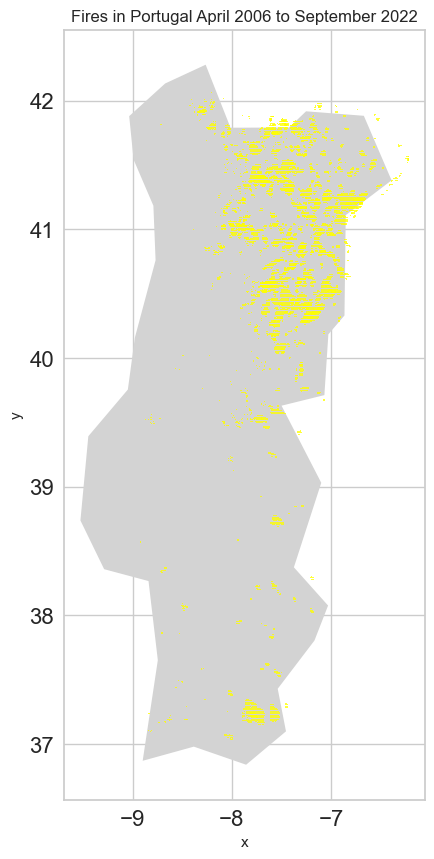

In [853]:
#visualizing fourth cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_3 = normalized_df_4[normalized_df_4['cluster'] == 3]


normalized_df_4_3.plot(x="x", y="y", kind="scatter", color = 'yellow',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

In [854]:
# extract the coordinates of portugal from shape file/ it may be used later
portugal_coordinates = json.loads(countries[countries["name"] == "Portugal"]['geometry'].to_json())['features'][0]['geometry']['coordinates'][0]
portugal_x = [coordinate[0] for coordinate in portugal_coordinates]
portugal_x = np.array(portugal_x)

portugal_y = [coordinate[1] for coordinate in portugal_coordinates]
portugal_y = np.array(portugal_y)

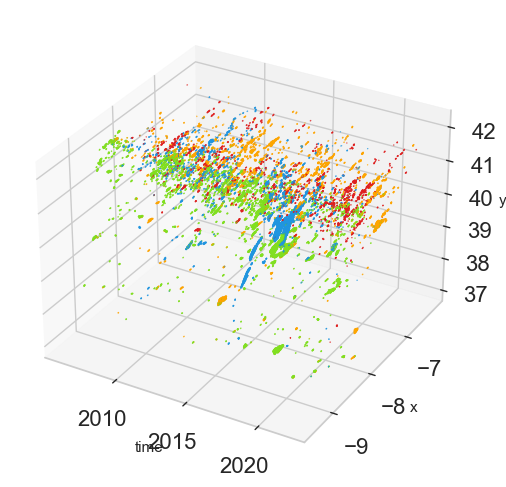

In [855]:
#3d visualization of the distribution of clusters
from mpl_toolkits.mplot3d import Axes3D  

import matplotlib.pyplot as plt
import numpy as np
viz = normalized_df_4.copy(deep = True)
from mpl_toolkits.mplot3d import Axes3D

viz['x'] = years['x']
viz['y'] = years['y']
viz['year'] = years['year']
colors2 = ['#DF2020', '#81DF20', '#2095DF', 'orange']
viz['c'] = viz.cluster.map({0:colors2[0], 1:colors2[1], 2:colors2[2], 3:colors2[3]})
fig = plt.figure(figsize=(26,6))
ax = fig.add_subplot(131, projection='3d')
ax.scatter(viz.year, viz.x, viz.y,  c=viz.c, s=0.5)
ax.set_xlabel('time')
ax.set_ylabel('x')
ax.set_zlabel('y')
plt.show()

##### Plot majority cluster

In [856]:
years_probability = years.copy(deep=True)
years_probability['cluster'] = normalized_df_4['cluster']
years_probability['x_int'] = round(years_probability['x'], 3) * 1000
years_probability['x_int'] = years_probability['x_int'].astype('int')

In [857]:
majority_cluster = years_probability.groupby(['x_int', 'y_int'])['cluster'].aggregate(pd.Series.mode)
x_int = [coordinate[0] for coordinate in majority_cluster.index]
y_int = [coordinate[1] for coordinate in majority_cluster.index]

majority = []
for val in majority_cluster.values:
    # handles edge case when the majority cluster is more than 1, so picks any of them
    if isinstance(val, np.ndarray):
        val = val[0]
    majority.append(val)
    
majority_cluster = pd.DataFrame({'x_int':x_int, 'y_int': y_int, 'cluster':majority})
majority_cluster['x'] = majority_cluster['x_int'].astype('float')
majority_cluster['x'] = majority_cluster['x']/1000
majority_cluster['y'] = majority_cluster['y_int'].astype('float')
majority_cluster['y']  = majority_cluster['y']/100
majority_cluster

,x_int,y_int,cluster,x,y
0,-9481,3875,2,-9.481,38.75
1,-9481,3876,2,-9.481,38.76
2,-9471,3872,2,-9.471,38.72
3,-9471,3873,2,-9.471,38.73
4,-9471,3874,2,-9.471,38.74
...,...,...,...,...,...
22563,-6228,4155,3,-6.228,41.55
22564,-6228,4156,3,-6.228,41.56
22565,-6218,4154,3,-6.218,41.54
22566,-6218,4155,3,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\3660046696.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


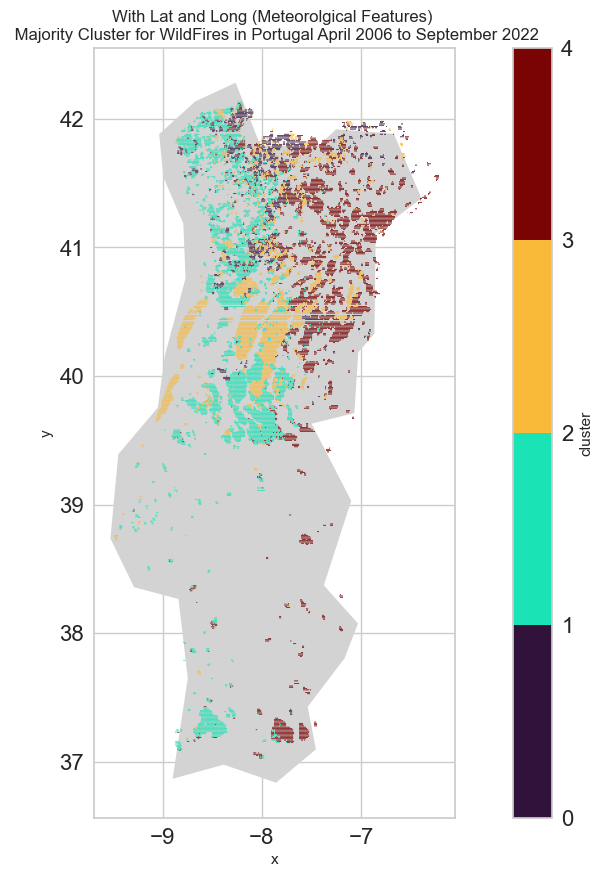

In [858]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

majority_cluster.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"With Lat and Long (Meteorolgical Features) \n Majority Cluster for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Visualize Probability of falling within a cluster

In [859]:
all_clusters = years_probability.groupby(['x_int', 'y_int'])['cluster'].value_counts()

In [860]:
Dict = {}

for idx, coordinate in enumerate(all_clusters.index):
    x_int = coordinate[0]
    y_int = coordinate[1]
    cluster = coordinate[2]
    val = all_clusters.values[idx]
    if tuple([x_int, y_int]) not in Dict:
        clusters = [0, 0, 0, 0]
        clusters[cluster] = val
        Dict[tuple([x_int, y_int])] = clusters
    else:
        Dict[tuple([x_int, y_int])][cluster] = val

x_int = []
y_int = []
cluster_1 = []
cluster_1_prob = []
cluster_2 = []
cluster_2_prob = []
cluster_3 = []
cluster_3_prob = []
cluster_4 = []
cluster_4_prob = []
total = []

for key in Dict:
    x_int.append(key[0])
    y_int.append(key[1])
    cluster_1.append(Dict[key][0])
    cluster_2.append(Dict[key][1])
    cluster_3.append(Dict[key][2])
    cluster_4.append(Dict[key][3])
    total_count = Dict[key][0] + Dict[key][1] + Dict[key][2] +Dict[key][3]
    total.append(total_count)
    cluster_1_prob.append(Dict[key][0]/total_count)
    cluster_2_prob.append(Dict[key][1]/total_count)
    cluster_3_prob.append(Dict[key][2]/total_count)
    cluster_4_prob.append(Dict[key][3]/total_count)



clusters_probablity = pd.DataFrame({'x_int': x_int, 'y_int': y_int, 'cluster1': cluster_1, 'cluster_1_probability':cluster_1_prob, 'cluster2': cluster_2, 'cluster_2_probability':cluster_2_prob, 'cluster3':cluster_3, 'cluster_3_probability':cluster_3_prob, 'cluster4':cluster_4, 'cluster_4_probability':cluster_4_prob, 'total':total})

clusters_probablity['x'] = clusters_probablity['x_int'].astype('float')
clusters_probablity['x'] = clusters_probablity['x']/1000
clusters_probablity['y'] = clusters_probablity['y_int'].astype('float')
clusters_probablity['y']  = clusters_probablity['y']/100

In [861]:
clusters_probablity

,x_int,y_int,cluster1,cluster_1_probability,cluster2,cluster_2_probability,cluster3,cluster_3_probability,cluster4,cluster_4_probability,total,x,y
0,-9481,3875,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.481,38.75
1,-9481,3876,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.481,38.76
2,-9471,3872,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.471,38.72
3,-9471,3873,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.471,38.73
4,-9471,3874,0,0.0,0,0.0,1,1.0,0,0.0,1,-9.471,38.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22563,-6228,4155,0,0.0,0,0.0,0,0.0,2,1.0,2,-6.228,41.55
22564,-6228,4156,0,0.0,0,0.0,0,0.0,1,1.0,1,-6.228,41.56
22565,-6218,4154,0,0.0,0,0.0,0,0.0,2,1.0,2,-6.218,41.54
22566,-6218,4155,0,0.0,0,0.0,0,0.0,2,1.0,2,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\182694575.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


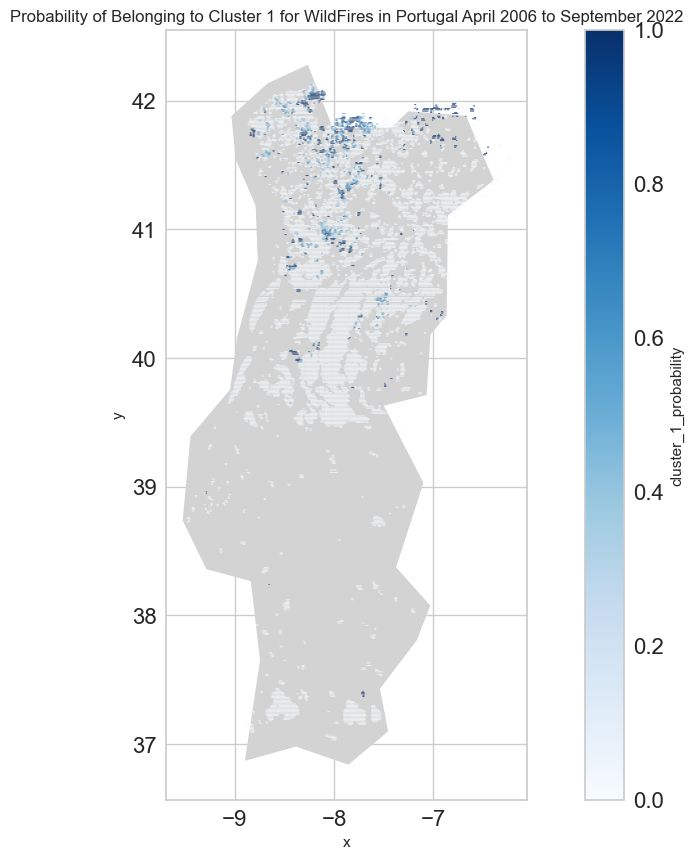

In [862]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_1_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 1 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1781413263.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


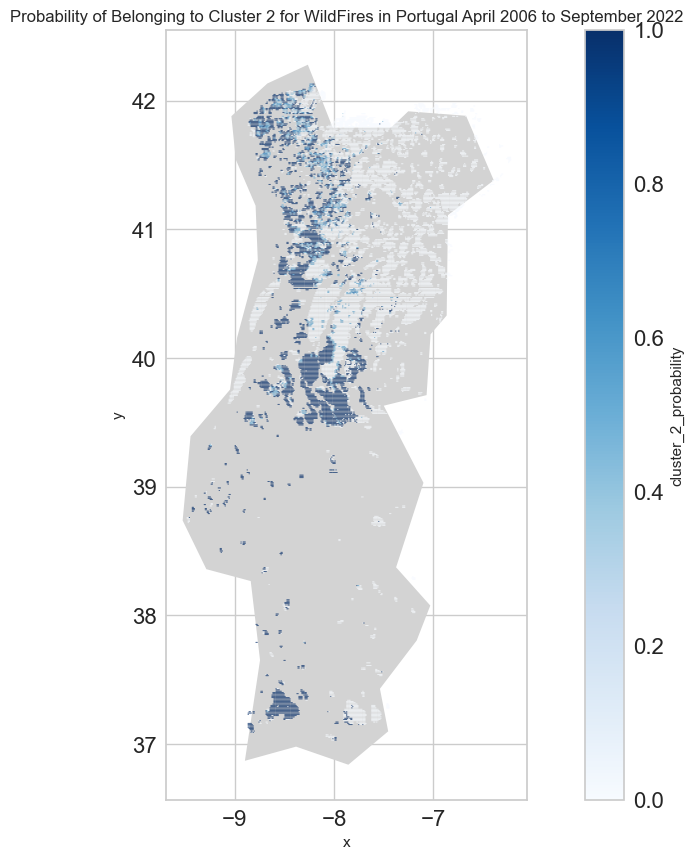

In [863]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_2_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 2 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\336700447.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


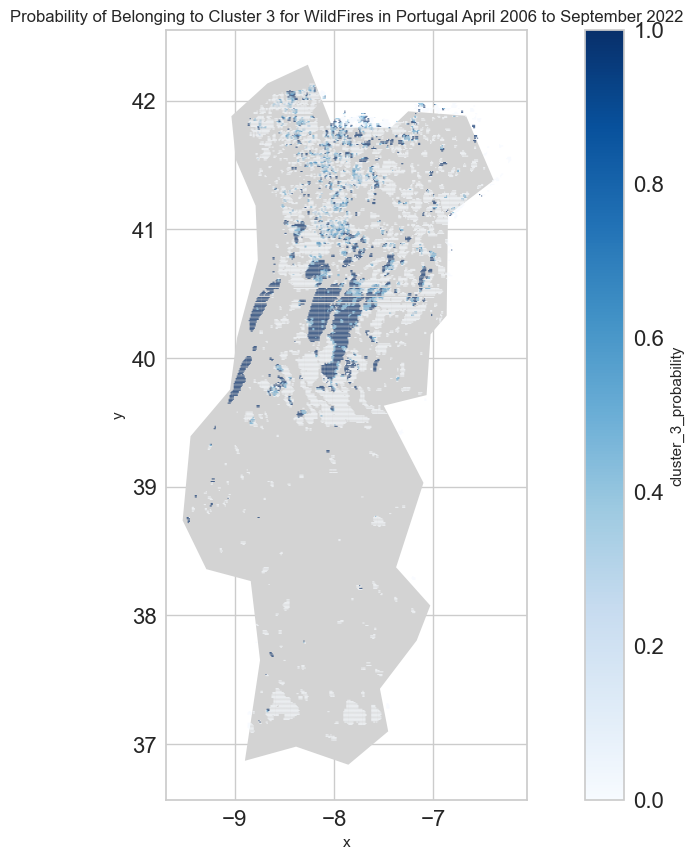

In [864]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_3_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 3 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1814191791.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


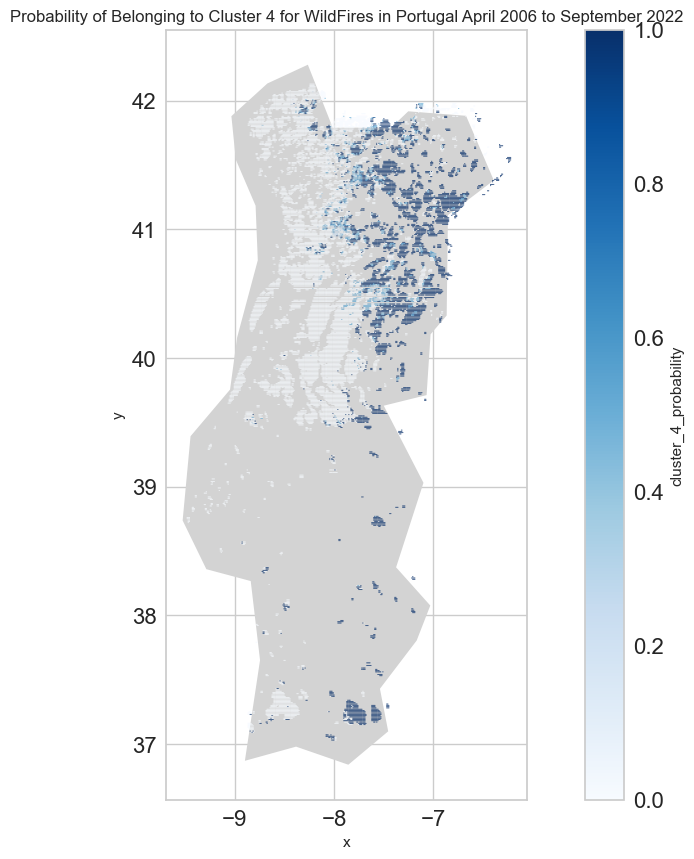

In [865]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_4_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 4 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Box Plot

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .item

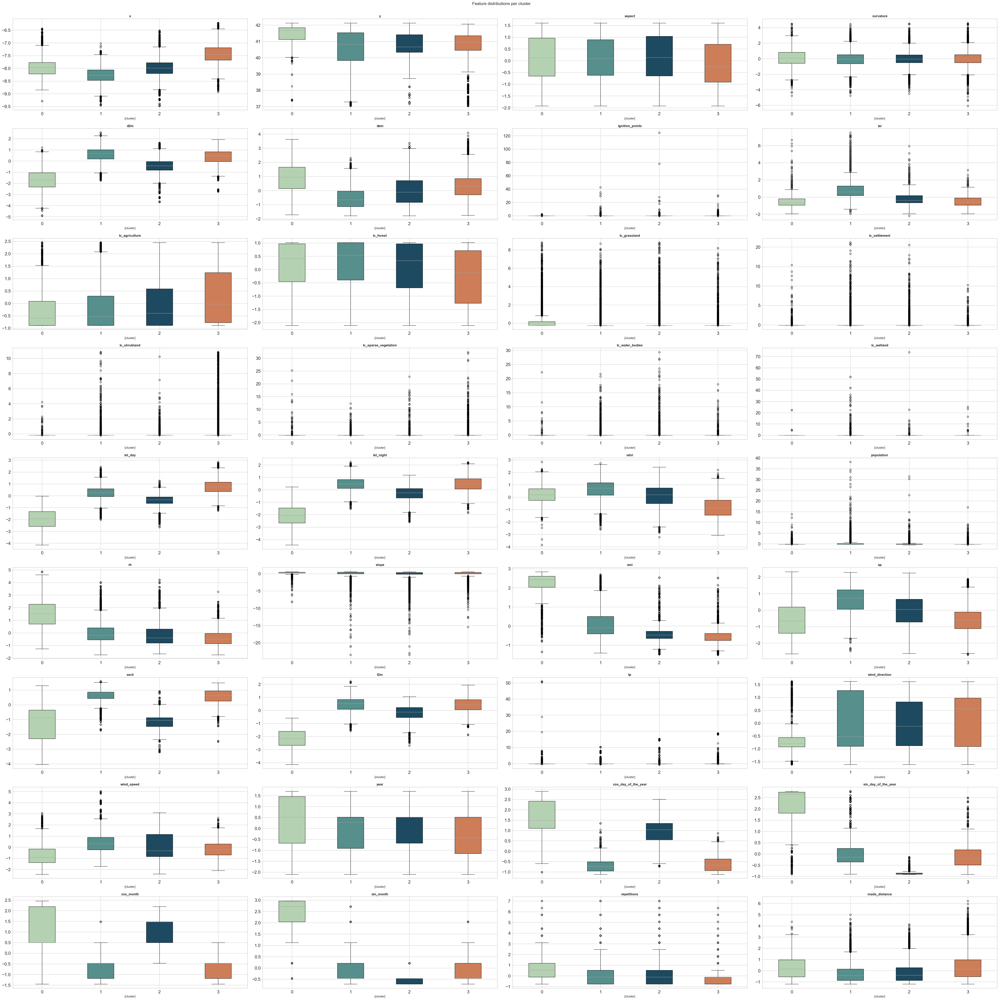

In [866]:
cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59']
normalized_df_4.columns = normalized_df_4.columns.get_level_values(0)
cols = normalized_df_4.columns.to_list()
features = cols
features.remove('cluster')
ncols = 4
nrows = len(features) // ncols + (len(features) % ncols > 0)
fig = plt.figure(figsize=(50,50))

for n, feature in enumerate(features):
    ax = plt.subplot(nrows, ncols, n + 1)
    box = normalized_df_4[[feature, 'cluster']].boxplot(by='cluster',ax=ax,return_type='both',patch_artist = True)

    for row_key, (ax,row) in box.iteritems():
        ax.set_title(feature,fontweight="bold")
        for i,box in enumerate(row['boxes']):
            box.set_facecolor(cluster_colors[i])

fig.suptitle('Feature distributions per cluster', fontsize=15, y=1)   
plt.tight_layout()
plt.show()

#### Without Lat and Long (Meteorolgical Features)

In [867]:
years_knn = years.copy(deep=True)
# drop irrelevant columns
cols = [ 'x', 'y', 'time', 'day_of_the_year', 'x_int', 'y_int', 'day', 'month', 'burned_areas', 'd2m_mean', 'lst_day_mean', 'lst_night_mean', 'rh_mean', 'sp_mean', 'ssrd_mean', 't2m_mean', 'tp_mean', 'wind_speed_mean', 'wind_direction_mean']
years_knn = years_knn.drop(columns=cols)

In [868]:
#non-normalized values
years_4 = years_knn.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(years_4)
years_4['cluster'] = kmeans.predict(years_4)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


##### Normalized vs non-normalized

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1754960804.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


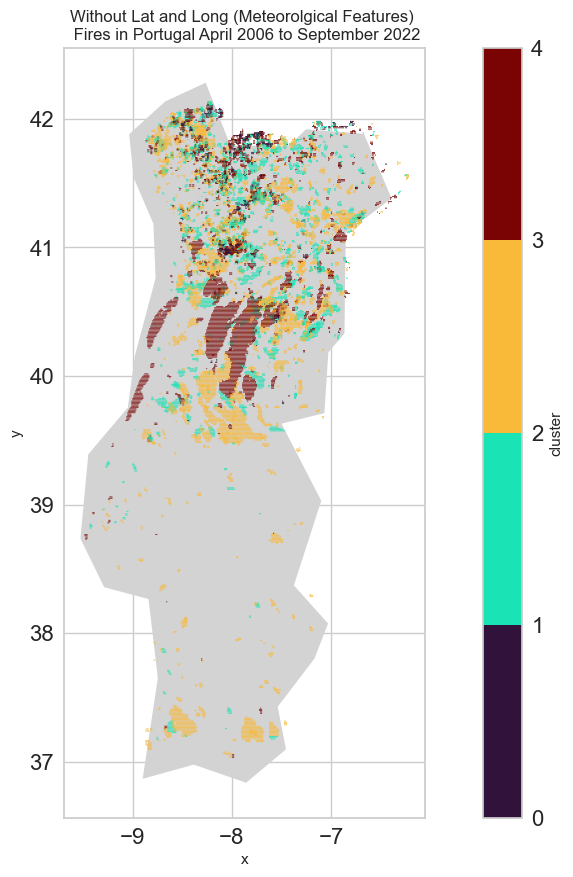

In [869]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
years_4['x'] = years['x']
years_4['y'] = years['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

years_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Without Lat and Long (Meteorolgical Features) \n Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

In [870]:
# z-score clustering
normalized_df=(years_knn-years_knn.mean())/years_knn.std()
# other clustering methods:
#[0,1]
# normalized_df=(years_knn-years_knn.min())/(years_knn.max()-years_knn.min())
#[-1, 1] normalization:
# normalized_df=(years_knn)/(years_knn.max()-years_knn.min())



normalized_df_4 = normalized_df.copy(deep=True)
kmeans = KMeans(4)
kmeans.fit(normalized_df_4)
normalized_df_4['cluster'] = kmeans.predict(normalized_df)

c:\Users\asera\anaconda3\envs\nnproject\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\2546270695.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


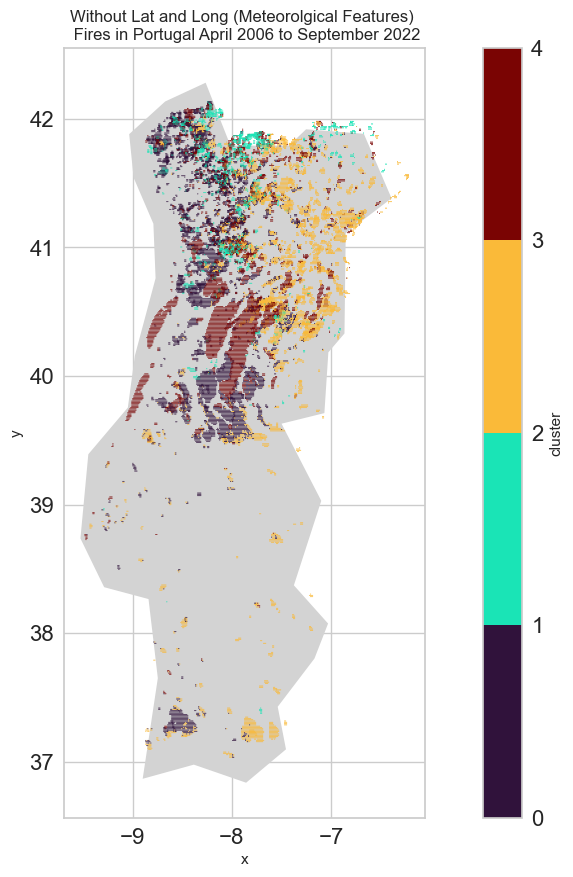

In [871]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

normalized_df_4.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Without Lat and Long (Meteorolgical Features) \n Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

Visulaization of clusters show that normalized variables are clustered well with clear separation between the clusters compared to non-normalized.

##### Basic Visualizations

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\2538222940.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


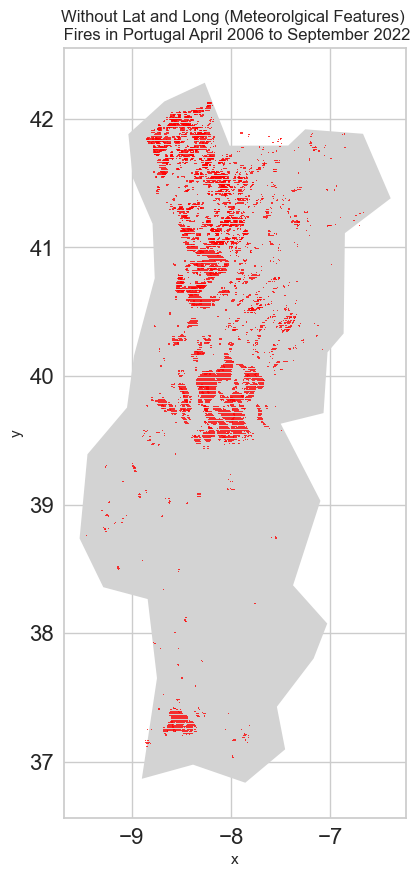

In [872]:
#visualizing first cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_0 = normalized_df_4[normalized_df_4['cluster'] == 0]


normalized_df_4_0.plot(x="x", y="y", kind="scatter", color = 'red',
        s= 0.15,
        title=f"Without Lat and Long (Meteorolgical Features) \n Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\167259454.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


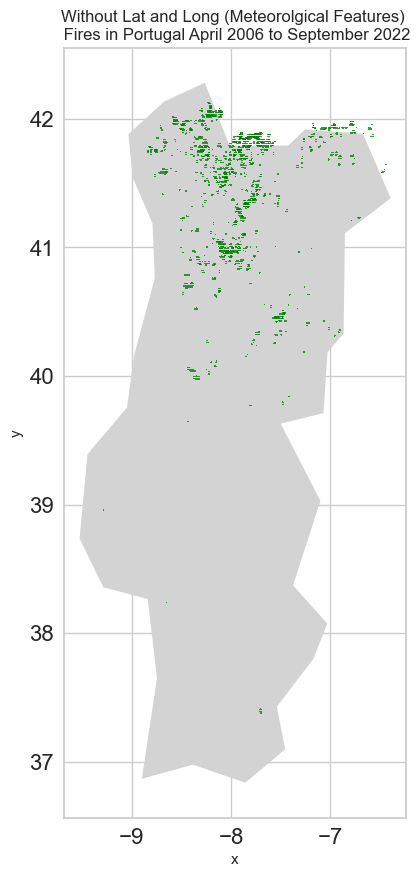

In [873]:
#visualizing second cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_1 = normalized_df_4[normalized_df_4['cluster'] == 1]


normalized_df_4_1.plot(x="x", y="y", kind="scatter", color = 'green',
        s= 0.15,
        title=f"Without Lat and Long (Meteorolgical Features) \n Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1057899606.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


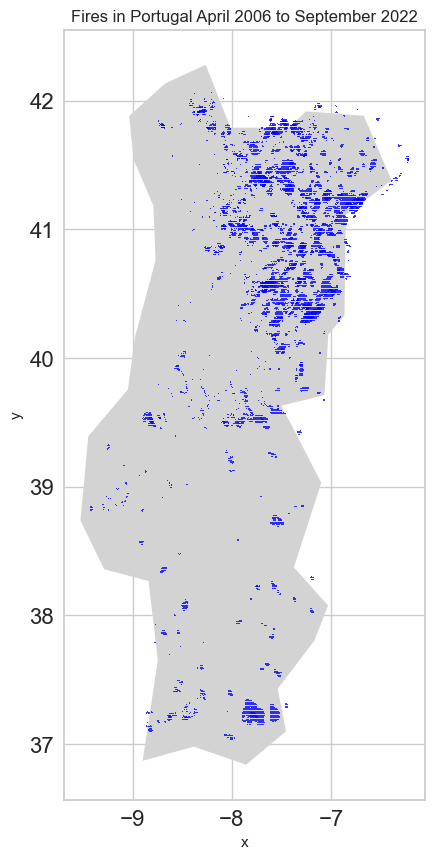

In [874]:
#visualizing third cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_2 = normalized_df_4[normalized_df_4['cluster'] == 2]


normalized_df_4_2.plot(x="x", y="y", kind="scatter", color = 'blue',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\617300168.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


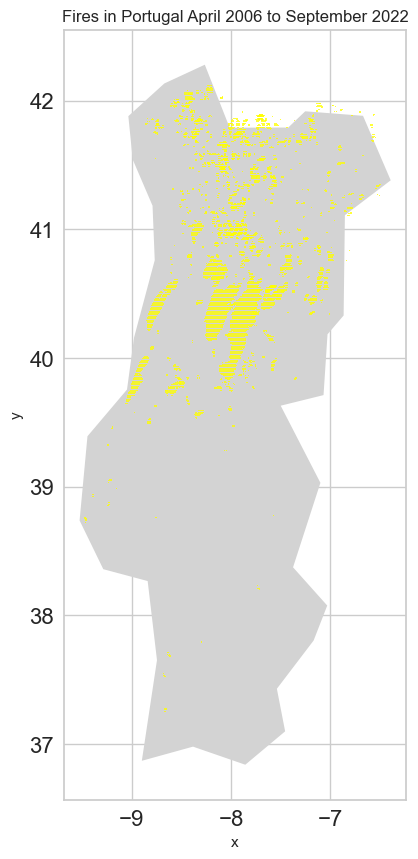

In [875]:
#visualizing fourth cluster

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points
normalized_df_4['x'] = years['x']
normalized_df_4['y'] = years['y']
normalized_df_4_3 = normalized_df_4[normalized_df_4['cluster'] == 3]


normalized_df_4_3.plot(x="x", y="y", kind="scatter", color = 'yellow',
        s= 0.15,
        title=f"Fires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

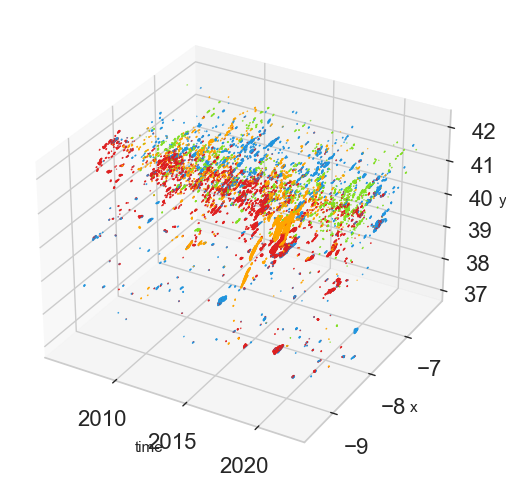

In [876]:
#3d visualization of the distribution of clusters
from mpl_toolkits.mplot3d import Axes3D  

import matplotlib.pyplot as plt
import numpy as np
viz = normalized_df_4.copy(deep = True)
from mpl_toolkits.mplot3d import Axes3D

viz['x'] = years['x']
viz['y'] = years['y']
viz['year'] = years['year']
colors2 = ['#DF2020', '#81DF20', '#2095DF', 'orange']
viz['c'] = viz.cluster.map({0:colors2[0], 1:colors2[1], 2:colors2[2], 3:colors2[3]})
fig = plt.figure(figsize=(26,6))
ax = fig.add_subplot(131, projection='3d')
ax.scatter(viz.year, viz.x, viz.y,  c=viz.c, s=0.5)
ax.set_xlabel('time')
ax.set_ylabel('x')
ax.set_zlabel('y')
plt.show()

##### Plot majority cluster

In [877]:
years_probability = years.copy(deep=True)
years_probability['cluster'] = normalized_df_4['cluster']
years_probability['x_int'] = round(years_probability['x'], 3) * 1000
years_probability['x_int'] = years_probability['x_int'].astype('int')

In [878]:
majority_cluster = years_probability.groupby(['x_int', 'y_int'])['cluster'].aggregate(pd.Series.mode)
x_int = [coordinate[0] for coordinate in majority_cluster.index]
y_int = [coordinate[1] for coordinate in majority_cluster.index]

majority = []
for val in majority_cluster.values:
    # handles edge case when the majority cluster is more than 1, so picks any of them
    if isinstance(val, np.ndarray):
        val = val[0]
    majority.append(val)
    
majority_cluster = pd.DataFrame({'x_int':x_int, 'y_int': y_int, 'cluster':majority})
majority_cluster['x'] = majority_cluster['x_int'].astype('float')
majority_cluster['x'] = majority_cluster['x']/1000
majority_cluster['y'] = majority_cluster['y_int'].astype('float')
majority_cluster['y']  = majority_cluster['y']/100
majority_cluster

,x_int,y_int,cluster,x,y
0,-9481,3875,3,-9.481,38.75
1,-9481,3876,3,-9.481,38.76
2,-9471,3872,3,-9.471,38.72
3,-9471,3873,3,-9.471,38.73
4,-9471,3874,3,-9.471,38.74
...,...,...,...,...,...
22563,-6228,4155,2,-6.228,41.55
22564,-6228,4156,2,-6.228,41.56
22565,-6218,4154,2,-6.218,41.54
22566,-6218,4155,2,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1559696913.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


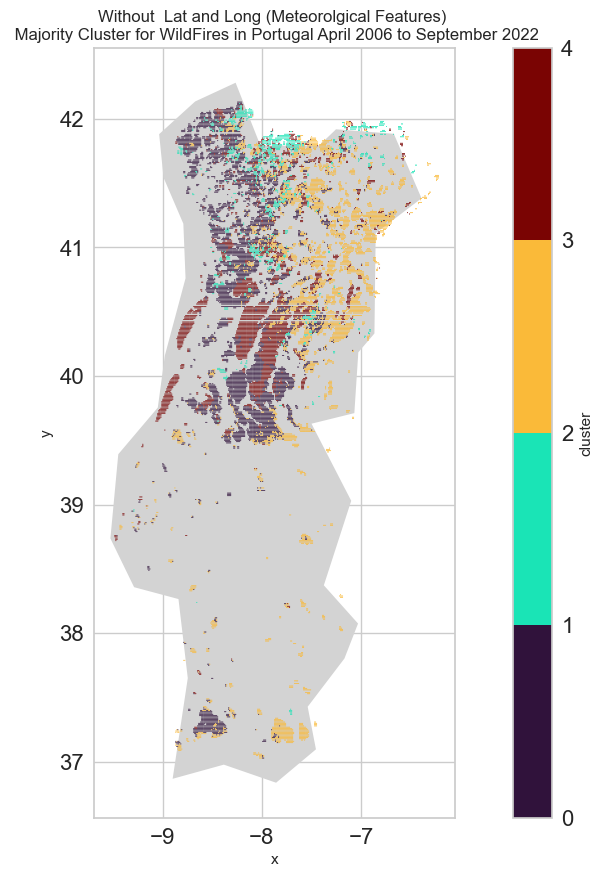

In [879]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.turbo
norm = colors.BoundaryNorm(np.arange(0, 5, 1), cmap.N)

majority_cluster.plot(x="x", y="y", kind="scatter", 
        c="cluster", colormap=cmap, norm=norm, s= 0.15,
        title=f"Without  Lat and Long (Meteorolgical Features) \n Majority Cluster for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Visualize Probability of falling within a cluster

In [880]:
all_clusters = years_probability.groupby(['x_int', 'y_int'])['cluster'].value_counts()

In [881]:
Dict = {}

for idx, coordinate in enumerate(all_clusters.index):
    x_int = coordinate[0]
    y_int = coordinate[1]
    cluster = coordinate[2]
    val = all_clusters.values[idx]
    if tuple([x_int, y_int]) not in Dict:
        clusters = [0, 0, 0, 0]
        clusters[cluster] = val
        Dict[tuple([x_int, y_int])] = clusters
    else:
        Dict[tuple([x_int, y_int])][cluster] = val

x_int = []
y_int = []
cluster_1 = []
cluster_1_prob = []
cluster_2 = []
cluster_2_prob = []
cluster_3 = []
cluster_3_prob = []
cluster_4 = []
cluster_4_prob = []
total = []

for key in Dict:
    x_int.append(key[0])
    y_int.append(key[1])
    cluster_1.append(Dict[key][0])
    cluster_2.append(Dict[key][1])
    cluster_3.append(Dict[key][2])
    cluster_4.append(Dict[key][3])
    total_count = Dict[key][0] + Dict[key][1] + Dict[key][2] +Dict[key][3]
    total.append(total_count)
    cluster_1_prob.append(Dict[key][0]/total_count)
    cluster_2_prob.append(Dict[key][1]/total_count)
    cluster_3_prob.append(Dict[key][2]/total_count)
    cluster_4_prob.append(Dict[key][3]/total_count)



clusters_probablity = pd.DataFrame({'x_int': x_int, 'y_int': y_int, 'cluster1': cluster_1, 'cluster_1_probability':cluster_1_prob, 'cluster2': cluster_2, 'cluster_2_probability':cluster_2_prob, 'cluster3':cluster_3, 'cluster_3_probability':cluster_3_prob, 'cluster4':cluster_4, 'cluster_4_probability':cluster_4_prob, 'total':total})

clusters_probablity['x'] = clusters_probablity['x_int'].astype('float')
clusters_probablity['x'] = clusters_probablity['x']/1000
clusters_probablity['y'] = clusters_probablity['y_int'].astype('float')
clusters_probablity['y']  = clusters_probablity['y']/100

In [882]:
clusters_probablity

,x_int,y_int,cluster1,cluster_1_probability,cluster2,cluster_2_probability,cluster3,cluster_3_probability,cluster4,cluster_4_probability,total,x,y
0,-9481,3875,0,0.0,0,0.0,0,0.0,1,1.0,1,-9.481,38.75
1,-9481,3876,0,0.0,0,0.0,0,0.0,1,1.0,1,-9.481,38.76
2,-9471,3872,0,0.0,0,0.0,0,0.0,1,1.0,1,-9.471,38.72
3,-9471,3873,0,0.0,0,0.0,0,0.0,1,1.0,1,-9.471,38.73
4,-9471,3874,0,0.0,0,0.0,0,0.0,1,1.0,1,-9.471,38.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22563,-6228,4155,0,0.0,0,0.0,2,1.0,0,0.0,2,-6.228,41.55
22564,-6228,4156,0,0.0,0,0.0,1,1.0,0,0.0,1,-6.228,41.56
22565,-6218,4154,0,0.0,0,0.0,2,1.0,0,0.0,2,-6.218,41.54
22566,-6218,4155,0,0.0,0,0.0,2,1.0,0,0.0,2,-6.218,41.55


C:\Users\asera\AppData\Local\Temp\ipykernel_27632\182694575.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


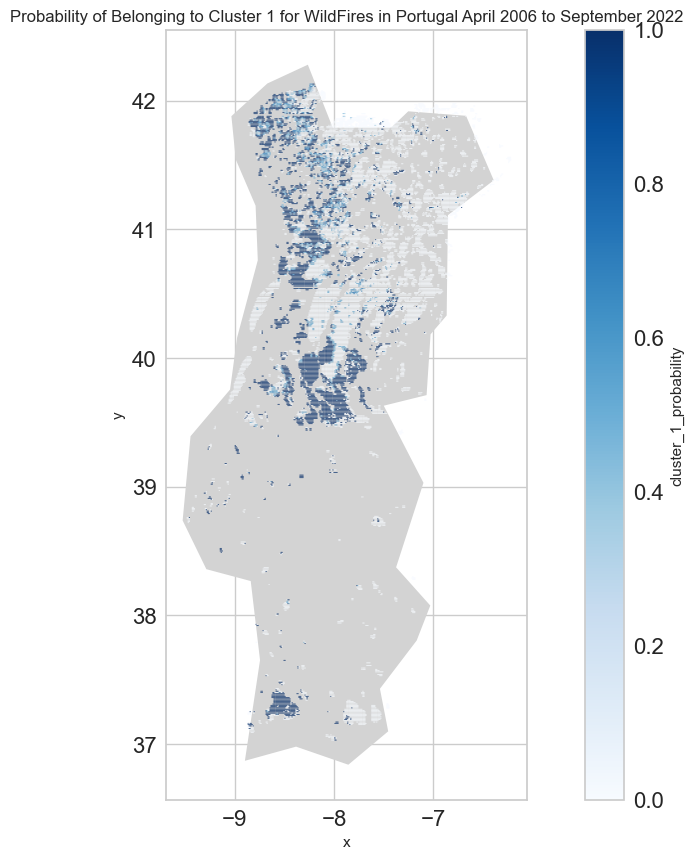

In [883]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_1_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 1 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1781413263.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


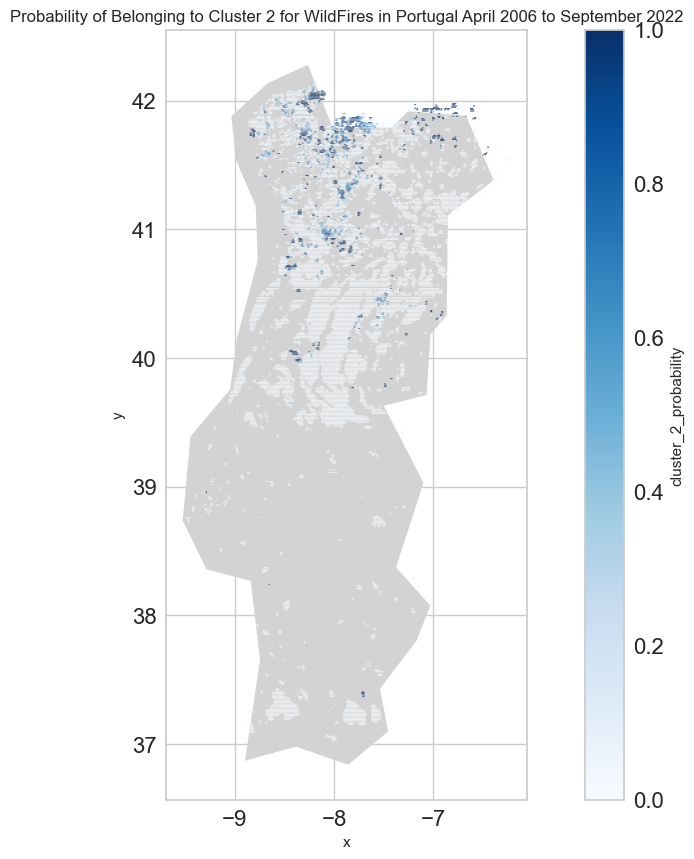

In [884]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_2_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 2 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\336700447.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


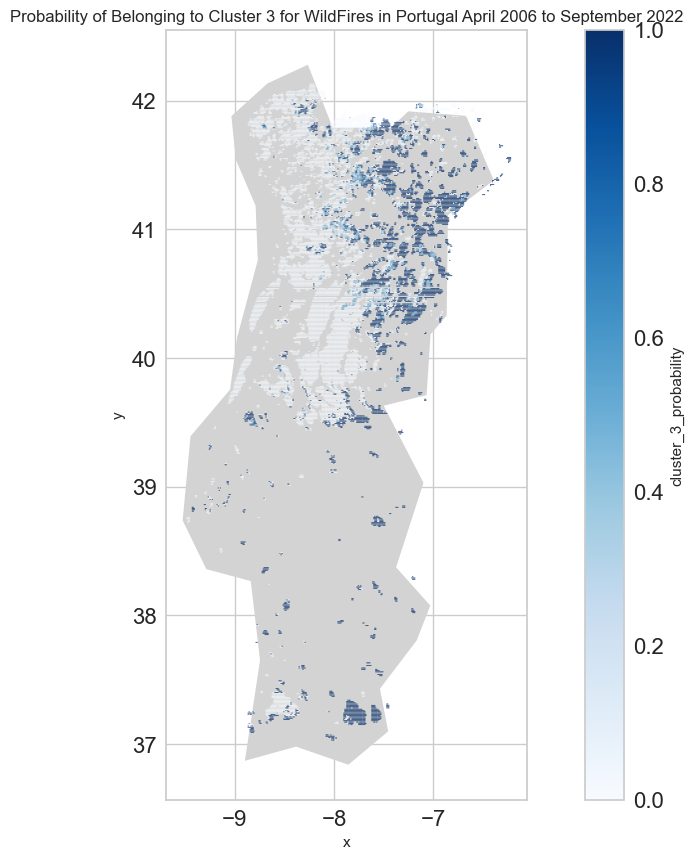

In [885]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_3_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 3 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\1814191791.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres"))


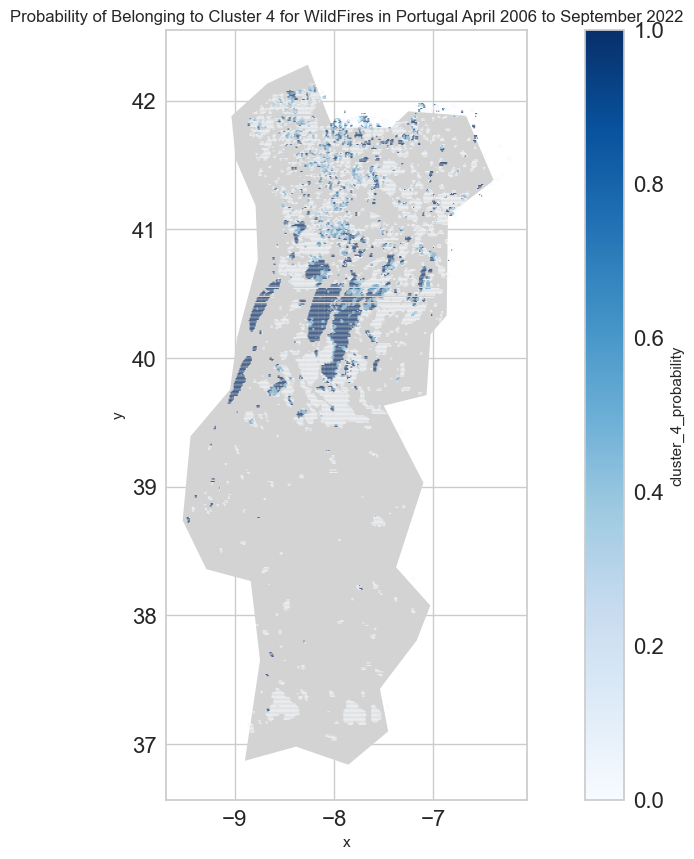

In [886]:

# initialize an axis
fig, ax = plt.subplots(figsize=(15,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Portugal"].plot(color="lightgrey",
                                                 ax=ax)
# parse dates for plot's title
first_month ="April 2006"
last_month = "September 2022"
# plot points

cmap = plt.cm.Blues

clusters_probablity.plot(x="x", y="y", kind="scatter", 
        c="cluster_4_probability", colormap=cmap, s= 0.15,
        title=f"Probability of Belonging to Cluster 4 for WildFires in Portugal {first_month} to {last_month}", 
        ax=ax)
# add grid
plt.show()

##### Box Plot

C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for row_key, (ax,row) in box.iteritems():
C:\Users\asera\AppData\Local\Temp\ipykernel_27632\695703704.py:14: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .item

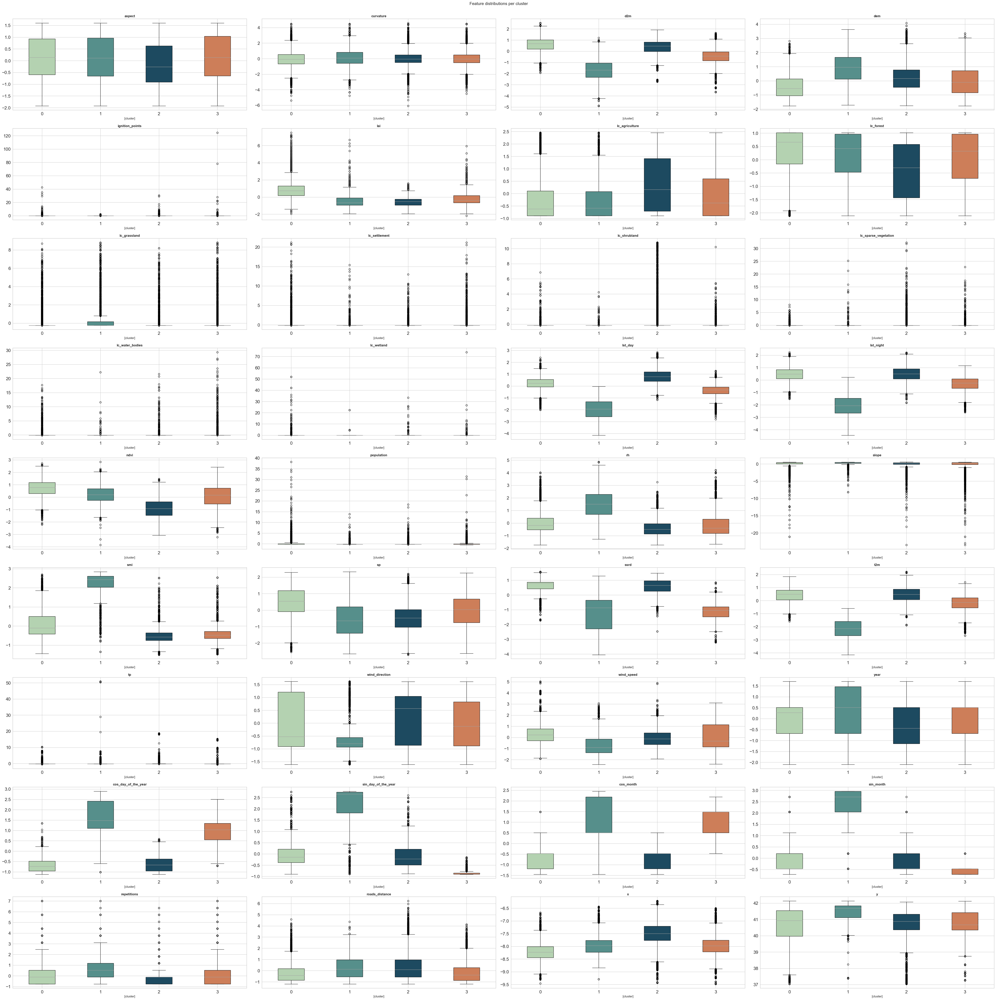

In [887]:
cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59']
normalized_df_4.columns = normalized_df_4.columns.get_level_values(0)
cols = normalized_df_4.columns.to_list()
features = cols
features.remove('cluster')
ncols = 4
nrows = len(features) // ncols + (len(features) % ncols > 0)
fig = plt.figure(figsize=(50,50))

for n, feature in enumerate(features):
    ax = plt.subplot(nrows, ncols, n + 1)
    box = normalized_df_4[[feature, 'cluster']].boxplot(by='cluster',ax=ax,return_type='both',patch_artist = True)

    for row_key, (ax,row) in box.iteritems():
        ax.set_title(feature,fontweight="bold")
        for i,box in enumerate(row['boxes']):
            box.set_facecolor(cluster_colors[i])

fig.suptitle('Feature distributions per cluster', fontsize=15, y=1)   
plt.tight_layout()
plt.show()